<a href="https://colab.research.google.com/github/vaishveerkumar/Data-Science/blob/main/AutoML_regression_CO2_emissions.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **ABSTRACT:**
Carbon dioxide (CO2) emissions wield considerable ramifications for the environment. The accumulation of CO2 in the atmosphere begets a greenhouse effect, fostering heat retention and thereby inducing global warming. This phenomenon results in a spectrum of adverse consequences, including elevated global temperatures, sea level escalation, shifts in weather patterns, and disruptions to ecosystems. The enduring repercussions of climate change pose a substantive threat to human health, agriculture, biodiversity, and socio-economic systems.

Consequently, the imperative to mitigate CO2 emissions assumes paramount importance. Such measures constitute a pivotal strategy in addressing climate change and attenuating its deleterious impact on the environment and human well-being

# **AIM:**
To Analyze the raw data collected from Kaggle and check the correlationship, multicollinearity, significant between variables, then use AutoML which belongs to H2O.ai to train the data and predict in 10 different models, finally print the best model's performance.

# **VARIABLE DESCRIPTION:**
Make: The brand or manufacturer of the vehicle.
Model: The specific model or name of the vehicle.
Vehicle Class: The category or type of the vehicle, such as compact or SUV.
Engine Size (L): The size of the vehicle's engine, measured in liters.
Cylinders: The number of cylinders in the vehicle's engine.
Transmission: The type of transmission in the vehicle (e.g., AS5 for automatic, 5-speed).
Fuel Type: The type of fuel the vehicle uses.
Fuel Consumption City (L/100 km): The amount of fuel consumed per 100 kilometers during city driving.
Fuel Consumption Hwy (L/100 km): The amount of fuel consumed per 100 kilometers during highway driving.
Fuel Consumption Comb (L/100 km): The combined fuel consumption, representing a mix of city and highway driving.
Fuel Consumption Comb (mpg): The combined fuel consumption converted to miles per gallon (mpg).
CO2 Emissions (g/km): The amount of carbon dioxide emissions produced by the vehicle per kilometer traveled.This is the outcome variable to be predicted.

**Importing required Libraries and H20 Initialization**

Automated machine learning (AutoML) is the process of automating the end-to-end process of applying machine learning to real-world problems.

H2O AutoML automates the steps like basic data processing, model training and tuning, Ensemble and stacking of various models to provide the models with the best performance so that developers can focus on other steps like data collection, feature engineering and deployment of model.

We are initializing H2O in the following steps.

In [ ]:
!pip install requests
!pip install tabulate
!pip install "colorama>=0.3.8"
!pip install future
!pip install -f http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html h2o


Looking in links: http://h2o-release.s3.amazonaws.com/h2o/latest_stable_Py.html
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 265.6/265.6 MB 4.4 MB/s eta 0:00:00


In [ ]:

import h2o
from h2o.automl import H2OAutoML
import random, os, sys
from datetime import datetime
import pandas as pd
import logging
import csv
import optparse
import time
import json
from distutils.util import strtobool
import psutil
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
sns.set(context="notebook", palette="Spectral", style = 'darkgrid' ,font_scale = 1.5, color_codes=True)
import warnings
warnings.filterwarnings('ignore')
import os
import matplotlib.pyplot as plt
import statsmodels.api as sm
from statsmodels.compat import lzip
import statsmodels.stats.api as sms
from sklearn.model_selection import train_test_split as tts
from statsmodels.stats.outliers_influence import variance_inflation_factor
import numpy as np
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeCV
from sklearn.metrics import r2_score,mean_squared_error,mean_absolute_error
from yellowbrick.regressor import ResidualsPlot
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import GridSearchCV,RandomizedSearchCV

min_mem_size=6 #Setting initial memory size to 6 GB.
run_time=222 #runtime in secs for the H2O cluster.

pct_memory=0.5
virtual_memory=psutil.virtual_memory()
min_mem_size=int(round(int(pct_memory*virtual_memory.available)/1073741824,0))
print(min_mem_size)


6


**h2o initialization- based on a percentage of available system memory and ensures the random selection of a port number for the H2O cluster**

In [ ]:
port_no=random.randint(5555,55555)
try:
  h2o.init(strict_version_check=False,min_mem_size_GB=min_mem_size,port=port_no) # start h2o
except:
  logging.critical('h2o.init')
  h2o.download_all_logs(dirname=logs_path, filename=logfile)
  h2o.cluster().shutdown()
  sys.exit(2)

Checking whether there is an H2O instance running at http://localhost:35263..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.22" 2024-01-16; OpenJDK Runtime Environment (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1); OpenJDK 64-Bit Server VM (build 11.0.22+7-post-Ubuntu-0ubuntu222.04.1, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.10/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpfgeg0g0e
  JVM stdout: /tmp/tmpfgeg0g0e/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpfgeg0g0e/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:35263
Connecting to H2O server at http://127.0.0.1:35263 ... successful.


H2O_cluster_uptime:,08 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.46.0.1
H2O_cluster_version_age:,4 days
H2O_cluster_name:,H2O_from_python_unknownUser_gcm2su
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,6 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


# **Importing Data**

In [ ]:
import pandas as pd

# GitHub raw file URL
url = "https://raw.githubusercontent.com/vaishveerkumar/Data-Science/main/CO2%20Emissions.csv"

# Read CSV file into Pandas DataFrame
data = pd.read_csv(url)

data.head()


,Make,Model,Vehicle Class,Engine Size(L),Cylinders,Transmission,Fuel Type,Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km),Fuel Consumption Comb (L/100 km),Fuel Consumption Comb (mpg),CO2 Emissions(g/km)
0,ACURA,ILX,COMPACT,2.0,4,AS5,Z,9.9,6.7,8.5,33,196
1,ACURA,ILX,COMPACT,2.4,4,M6,Z,11.2,7.7,9.6,29,221
2,ACURA,ILX HYBRID,COMPACT,1.5,4,AV7,Z,6.0,5.8,5.9,48,136
3,ACURA,MDX 4WD,SUV - SMALL,3.5,6,AS6,Z,12.7,9.1,11.1,25,255
4,ACURA,RDX AWD,SUV - SMALL,3.5,6,AS6,Z,12.1,8.7,10.6,27,244


# **Dropping the following vehical data features**

Make, Model, Vehicle Class

The "Make", "Model" and "Vehicle Class" columns serve as identifiers for individual vehicles. Including these columns in the predictive model might not contribute meaningful information to the CO2 emissions as each row represents a unique vehicle. Vehicle Class is a categorical variable representing the type of vehicle.

In [ ]:
data = data.drop(["Make", "Model", "Vehicle Class"], axis=1)
data.head()

,Engine Size(L),Cylinders,Transmission,Fuel Type,Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km),Fuel Consumption Comb (L/100 km),Fuel Consumption Comb (mpg),CO2 Emissions(g/km)
0,2.0,4,AS5,Z,9.9,6.7,8.5,33,196
1,2.4,4,M6,Z,11.2,7.7,9.6,29,221
2,1.5,4,AV7,Z,6.0,5.8,5.9,48,136
3,3.5,6,AS6,Z,12.7,9.1,11.1,25,255
4,3.5,6,AS6,Z,12.1,8.7,10.6,27,244


# **Studying the data imported**

In [ ]:
data_describe=data.describe()

data.describe()

,Engine Size(L),Cylinders,Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km),Fuel Consumption Comb (L/100 km),Fuel Consumption Comb (mpg),CO2 Emissions(g/km)
count,7385.000000,7385.000000,7385.000000,7385.000000,7385.000000,7385.000000,7385.000000
mean,3.160068,5.615030,12.556534,9.041706,10.975071,27.481652,250.584699
std,1.354170,1.828307,3.500274,2.224456,2.892506,7.231879,58.512679
min,0.900000,3.000000,4.200000,4.000000,4.100000,11.000000,96.000000
25%,2.000000,4.000000,10.100000,7.500000,8.900000,22.000000,208.000000
50%,3.000000,6.000000,12.100000,8.700000,10.600000,27.000000,246.000000
75%,3.700000,6.000000,14.600000,10.200000,12.600000,32.000000,288.000000
max,8.400000,16.000000,30.600000,20.600000,26.100000,69.000000,522.000000


# **Inference from data.describe**

This table shows summary statistics for the numeric variables in the dataset

The variables are: Engine Size(L),Cylinders,Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km), Fuel Consumption Comb (L/100 km), Fuel Consumption Comb (mpg)  CO2 Emissions(g/km).

The "count" row shows the number of observations for each variable, while the "mean" row shows the average value of each variable.

The "std" row shows the standard deviation of each variable, which is a measure of how much the values vary from the mean.

The "min" and "max" rows show the smallest and largest values observed for each variable.

The "25%", "50%", and "75%" rows show the values at the 25th, 50th, and 75th percentiles of the distribution, respectively.

These percentiles divide the observations into quarters, with the 25th percentile being the value below which 25% of the observations fall and so on.


**The above numbers makes sense, for example the number of cylinders- minimum is 3 and mean is 5.6 and max is 16 which is in range for the given dataset.**

Similary For CO2 emissions- The average emissions of vehicles that were examied or included in the dataset was 250.58g/km. The least amount of emission was 96g/km and the most emission by a vehicle was 522g/km.

#**Visualizing Summary Statistics**

To understand this better we can visualize the summary statistics using an interactive bar plot which give values for each stat upon hover



In [ ]:
import plotly.graph_objects as go

summary_stats = data_describe.loc[['min', '25%', 'mean', '75%', 'max', 'std']]

fig = go.Figure()

for col in summary_stats.columns:
    fig.add_trace(go.Bar(
        x=summary_stats.index,
        y=summary_stats[col],
        name=col,
        hoverinfo='y+name',
    ))

fig.update_layout(
    barmode='group',
    title="Summary Statistics of Numeric Columns",
    xaxis_title="Numeric Columns",
    yaxis_title="Value",
)

fig.show()


In [ ]:
#one hot encoding the categorical independant variables to calculate VIF in further steps

data = pd.get_dummies(data, columns=['Transmission', 'Fuel Type'],dtype=int)

data

,Engine Size(L),Cylinders,Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km),Fuel Consumption Comb (L/100 km),Fuel Consumption Comb (mpg),CO2 Emissions(g/km),Transmission_A10,Transmission_A4,Transmission_A5,...,Transmission_AV7,Transmission_AV8,Transmission_M5,Transmission_M6,Transmission_M7,Fuel Type_D,Fuel Type_E,Fuel Type_N,Fuel Type_X,Fuel Type_Z
0,2.0,4,9.9,6.7,8.5,33,196,0,0,0,...,0,0,0,0,0,0,0,0,0,1
1,2.4,4,11.2,7.7,9.6,29,221,0,0,0,...,0,0,0,1,0,0,0,0,0,1
2,1.5,4,6.0,5.8,5.9,48,136,0,0,0,...,1,0,0,0,0,0,0,0,0,1
3,3.5,6,12.7,9.1,11.1,25,255,0,0,0,...,0,0,0,0,0,0,0,0,0,1
4,3.5,6,12.1,8.7,10.6,27,244,0,0,0,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7380,2.0,4,10.7,7.7,9.4,30,219,0,0,0,...,0,0,0,0,0,0,0,0,0,1
7381,2.0,4,11.2,8.3,9.9,29,232,0,0,0,...,0,0,0,0,0,0,0,0,0,1
7382,2.0,4,11.7,8.6,10.3,27,240,0,0,0,...,0,0,0,0,0,0,0,0,0,1
7383,2.0,4,11.2,8.3,9.9,29,232,0,0,0,...,0,0,0,0,0,0,0,0,0,1


# **Analysing relation between independant variables**

# Q3. Is there any multicollinearity in the model?

# Q4. In the multivariate models are predictor variables independent of all the other predictor variables?

To answer the two questions we can analyze the relationship between each predictor variables using 3 methods

1. correlation matrix

  A correlation matrix is a tabular representation of correlation coefficients between variables in a dataset. It shows the correlation between each pair of variables indicating the strength and direction of their linear relationship.

2. by calculating the VIF values
  
  VIF is a measure used to detect multicollinearity in regression analysis. Multicollinearity occurs when predictor variables in a regression model are highly correlated with each other, which can lead to inaccurate estimates of the regression coefficients. VIF quantifies how much the variance of a regression coefficient is inflated due to multicollinearity.

3. by calculating the eigen values
  
  In the context of assessing multicollinearity in a dataset, eigenvalues are used to measure the degree of linear dependency among the predictor variables.



In [ ]:
# the independent variables set
c= data[['Engine Size(L)',
    'Cylinders',
    'Fuel Consumption City (L/100 km)',
    'Fuel Consumption Hwy (L/100 km)',
    'Fuel Consumption Comb (L/100 km)',
    'Fuel Consumption Comb (mpg)',
    'Transmission_A10',
    'Transmission_A4',
    'Transmission_A5',
    'Transmission_A6',
    'Transmission_A7',
    'Transmission_A8',
    'Transmission_A9',
    'Transmission_AM5',
    'Transmission_AM6',
    'Transmission_AM7',
    'Transmission_AM8',
    'Transmission_AM9',
    'Transmission_AS10',
    'Transmission_AS4',
    'Transmission_AS5',
    'Transmission_AS6',
    'Transmission_AS7',
    'Transmission_AS8',
    'Transmission_AS9',
    'Transmission_AV',
    'Transmission_AV10',
    'Transmission_AV6',
    'Transmission_AV7',
    'Transmission_AV8',
    'Transmission_M5',
    'Transmission_M6',
    'Transmission_M7',
    'Fuel Type_D',
    'Fuel Type_E',
    'Fuel Type_N',
    'Fuel Type_X',
    'Fuel Type_Z']]

# VIF dataframe
vif_data = pd.DataFrame()
vif_data["feature"] = c.columns

# calculating VIF for each feature
vif_data["VIF"] = [variance_inflation_factor(c.values, i)
                          for i in range(len(c.columns))]

print(vif_data)

                             feature          VIF
0                     Engine Size(L)    10.415703
1                          Cylinders     9.352714
2   Fuel Consumption City (L/100 km)  2091.174648
3    Fuel Consumption Hwy (L/100 km)   572.675003
4   Fuel Consumption Comb (L/100 km)  4690.922796
5        Fuel Consumption Comb (mpg)    10.496649
6                   Transmission_A10          inf
7                    Transmission_A4          inf
8                    Transmission_A5          inf
9                    Transmission_A6          inf
10                   Transmission_A7          inf
11                   Transmission_A8          inf
12                   Transmission_A9          inf
13                  Transmission_AM5          inf
14                  Transmission_AM6          inf
15                  Transmission_AM7          inf
16                  Transmission_AM8          inf
17                  Transmission_AM9          inf
18                 Transmission_AS10          inf


In [ ]:
data.corr()

,Engine Size(L),Cylinders,Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km),Fuel Consumption Comb (L/100 km),Fuel Consumption Comb (mpg),CO2 Emissions(g/km),Transmission_A10,Transmission_A4,Transmission_A5,...,Transmission_AV7,Transmission_AV8,Transmission_M5,Transmission_M6,Transmission_M7,Fuel Type_D,Fuel Type_E,Fuel Type_N,Fuel Type_X,Fuel Type_Z
Engine Size(L),1.000000,0.927653,0.831379,0.761526,0.817060,-0.757854,0.851145,0.115444,0.035005,0.082283,...,-0.085643,-0.040485,-0.160277,-0.155131,0.046261,-0.068055,0.164828,0.003781,-0.236023,0.186346
Cylinders,0.927653,1.000000,0.800702,0.715252,0.780534,-0.719321,0.832644,0.073244,0.021429,0.046335,...,-0.078310,-0.041885,-0.149358,-0.154826,0.045005,-0.053873,0.118302,0.002451,-0.310360,0.277499
Fuel Consumption City (L/100 km),0.831379,0.800702,1.000000,0.948180,0.993810,-0.927059,0.919592,0.047660,0.092999,0.082107,...,-0.124949,-0.049058,-0.145531,-0.118235,0.014994,-0.111228,0.450996,0.008789,-0.321992,0.160233
Fuel Consumption Hwy (L/100 km),0.761526,0.715252,0.948180,1.000000,0.977299,-0.890638,0.883536,0.053677,0.138233,0.076236,...,-0.106043,-0.023289,-0.128692,-0.151254,-0.004302,-0.119631,0.483037,0.002398,-0.257733,0.084032
Fuel Consumption Comb (L/100 km),0.817060,0.780534,0.993810,0.977299,1.000000,-0.925576,0.918052,0.050234,0.109781,0.080967,...,-0.119910,-0.040648,-0.141211,-0.130877,0.008220,-0.115252,0.467394,0.006940,-0.303291,0.135427
Fuel Consumption Comb (mpg),-0.757854,-0.719321,-0.927059,-0.890638,-0.925576,1.000000,-0.907426,-0.051244,-0.058000,-0.083251,...,0.130543,0.032609,0.147897,0.115229,-0.031882,0.118642,-0.323444,-0.008822,0.309235,-0.205789
CO2 Emissions(g/km),0.851145,0.832644,0.919592,0.883536,0.918052,-0.907426,1.000000,0.071659,0.068239,0.088082,...,-0.125544,-0.041154,-0.154613,-0.117452,0.019191,-0.034712,0.096197,-0.007476,-0.260382,0.231164
Transmission_A10,0.115444,0.073244,0.047660,0.053677,0.050234,-0.051244,0.071659,1.000000,-0.006118,-0.006964,...,-0.008273,-0.004731,-0.010636,-0.024202,-0.007252,0.058733,-0.014911,-0.000756,-0.047200,0.036172
Transmission_A4,0.035005,0.021429,0.092999,0.138233,0.109781,-0.058000,0.068239,-0.006118,1.000000,-0.010108,...,-0.012008,-0.006866,-0.015437,-0.035127,-0.010525,-0.014681,0.084685,-0.001097,0.049263,-0.082446
Transmission_A5,0.082283,0.046335,0.082107,0.076236,0.080967,-0.083251,0.088082,-0.006964,-0.010108,1.000000,...,-0.013668,-0.007815,-0.017571,-0.039984,-0.011981,-0.016711,0.004633,-0.001248,0.088454,-0.086116


<Axes: >

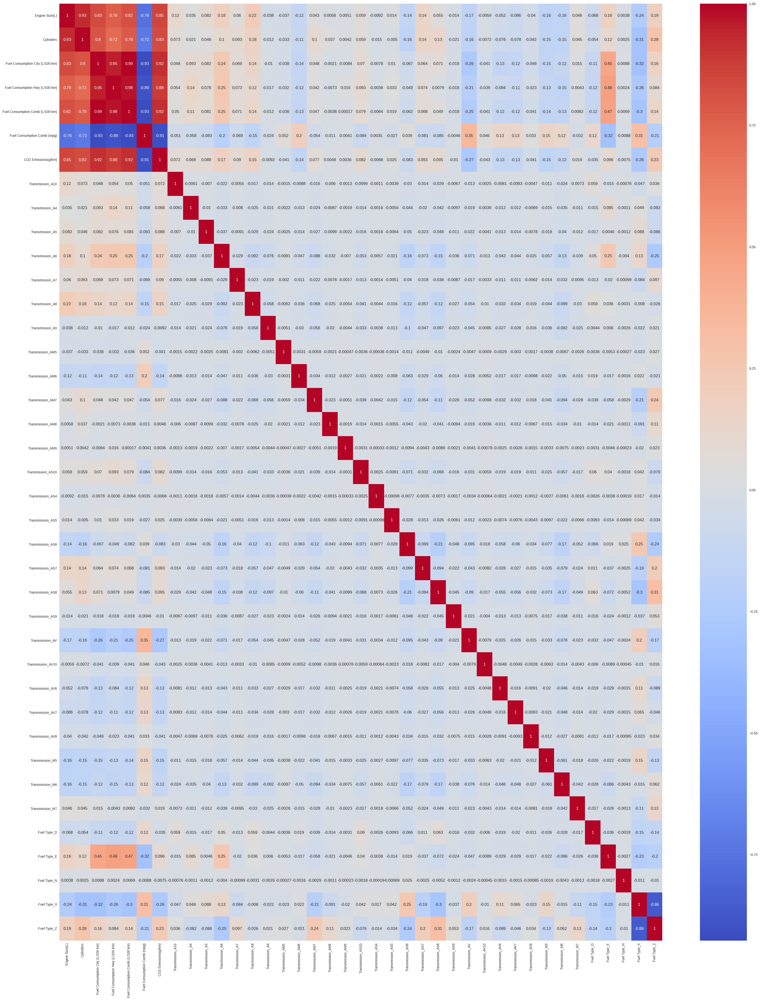

In [ ]:
plt.figure(figsize=(40,50))
sns.heatmap(data.corr(), annot=True, cmap='coolwarm')

In [ ]:
corr= data.corr(method='pearson')

#Eigen vector of a correlation matrix.
multicollinearity, V=np.linalg.eig(corr)
multicollinearity

array([ 6.81718315e+00,  2.38115913e+00,  7.67173863e-02,  5.80725044e-02,
        3.24286204e-02,  3.19412787e-01,  4.46512974e-03,  1.36610252e-04,
        4.67636671e-01,  6.76097942e-01, -2.68914014e-15,  5.00482478e-17,
        1.29356867e+00,  1.25113186e+00,  1.17479775e+00,  1.12342744e+00,
        9.12569043e-01,  1.10056053e+00,  9.43629684e-01,  1.05974463e+00,
        1.05376039e+00,  1.04926860e+00,  1.03609711e+00,  1.03459968e+00,
        1.02319533e+00,  1.02040719e+00,  1.01794806e+00,  1.01618618e+00,
        9.96850575e-01,  1.01236158e+00,  1.01103215e+00,  1.01048097e+00,
        1.00857041e+00,  1.00669347e+00,  1.00524365e+00,  1.00226040e+00,
        1.00123341e+00,  1.00037581e+00,  1.00069548e+00])

In [ ]:
#Calculating corr coeff- If the correlation coefficient is close to 1 or -1, it indicates a strong linear relationship

correlation_matrix = data.corr()
emission_correlation = correlation_matrix["CO2 Emissions(g/km)"].sort_values(ascending=False)
print(emission_correlation)

CO2 Emissions(g/km)                 1.000000
Fuel Consumption City (L/100 km)    0.919592
Fuel Consumption Comb (L/100 km)    0.918052
Fuel Consumption Hwy (L/100 km)     0.883536
Engine Size(L)                      0.851145
Cylinders                           0.832644
Fuel Type_Z                         0.231164
Transmission_A6                     0.168321
Transmission_A8                     0.151831
Fuel Type_E                         0.096197
Transmission_AS8                    0.095415
Transmission_AS7                    0.092683
Transmission_A7                     0.090287
Transmission_A5                     0.088082
Transmission_AS10                   0.081813
Transmission_AM7                    0.076568
Transmission_A10                    0.071659
Transmission_A4                     0.068239
Transmission_AS5                    0.024921
Transmission_M7                     0.019191
Transmission_AM8                    0.004838
Transmission_AM9                    0.003589
Transmissi

# **Inference- Multicollinearity, Correlation and Eigen Values**

1. Features with VIF values close to 1 indicate low multicollinearity, suggesting that these features are not highly correlated with other predictor variables in the model.

2. Features with VIF values greater than 5 or 10 are often considered to have problematic levels of multicollinearity, indicating strong correlations with other predictor variables.

3. In the output for VIF, features with VIF values such as "Fuel Consumption City (L/100 km)", "Fuel Consumption Hwy (L/100 km)", and "Fuel Consumption Comb (L/100 km)" have particularly high VIF values **suggesting potential multicollinearity issues.**

3. The features "Transmission_A10", "Transmission_A4", "Transmission_A5", "Transmission_A6", "Transmission_A7", and "Transmission_A8" have infinite (inf) VIF values, **indicating perfect multicollinearity**. This typically occurs when dummy variables are created for categorical features, and one of the dummy variables is redundant or perfectly predictable from the others.


4. In the correlation matrix, Warmer colors indicate a stronger positive correlation, while cooler colors indicate a stronger negative correlation

5. Larger eigenvalues correspond to dimensions with higher variability in the data and potentially higher levels of multicollinearity.



In [ ]:
sns.pairplot(data)

# **Q2. Are any model assumptions violated?**

Checking if the model has violated any assumptions would include checking if the following were violated:

(1)There needs to be linear relation between the independent and dependent variable- **From the values of the correlation coeff we can understand for most independent variables there is a linear relationship with the dependent variable and hence assumption is not violated**

(2)Secondly, linear regression assumes that there is little or no multicollinearity in the data- **From the eigen values as well as the correlation matrix we can understand that most of the variables are highly correlated and hence this assumption is violated.**


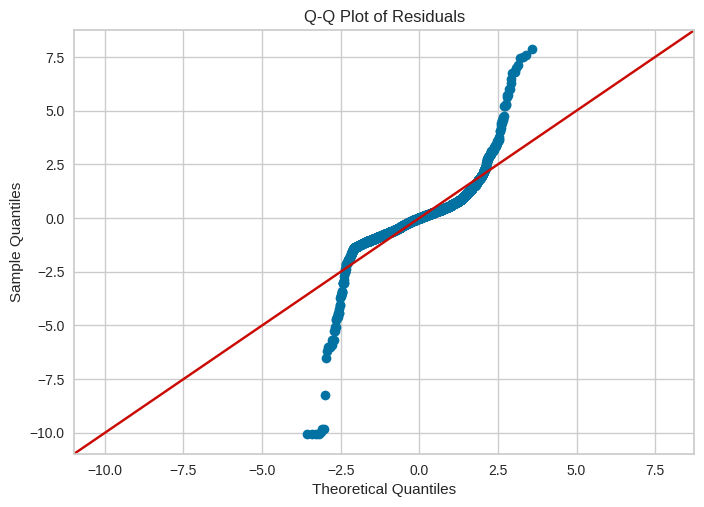

In [ ]:
import statsmodels.api as sm

#Seperating the predictor and target variables
A=data.drop(['CO2 Emissions(g/km)'],axis=1)
B=data['CO2 Emissions(g/km)']

#Splitting the data
A_train,A_test,b_train,b_test=tts(A,B,test_size=0.2,random_state=42)

cols1 = ['Engine Size(L)',
    'Cylinders',
    'Fuel Consumption City (L/100 km)',
    'Fuel Consumption Hwy (L/100 km)',
    'Fuel Consumption Comb (L/100 km)',
    'Fuel Consumption Comb (mpg)',
    'Transmission_A10',
    'Transmission_A4',
    'Transmission_A5',
    'Transmission_A6',
    'Transmission_A7',
    'Transmission_A8',
    'Transmission_A9',
    'Transmission_AM5',
    'Transmission_AM6',
    'Transmission_AM7',
    'Transmission_AM8',
    'Transmission_AM9',
    'Transmission_AS10',
    'Transmission_AS4',
    'Transmission_AS5',
    'Transmission_AS6',
    'Transmission_AS7',
    'Transmission_AS8',
    'Transmission_AS9',
    'Transmission_AV',
    'Transmission_AV10',
    'Transmission_AV6',
    'Transmission_AV7',
    'Transmission_AV8',
    'Transmission_M5',
    'Transmission_M6',
    'Transmission_M7',
    'Fuel Type_D',
    'Fuel Type_E',
    'Fuel Type_N',
    'Fuel Type_X',
    'Fuel Type_Z']

model1 = sm.OLS(b_train,sm.add_constant(A_train[cols1])).fit()

b_pred = model1.predict(sm.add_constant(A_train[cols1]))

residuals = b_train-b_pred

# Generate the Q-Q plot for the residuals
sm.qqplot(residuals, line='45', fit=True)
plt.title('Q-Q Plot of Residuals')
plt.show()


**From the Q-Q Plot it is clear regarding the normality of residuals but we will use a dist plot to determine the same.**

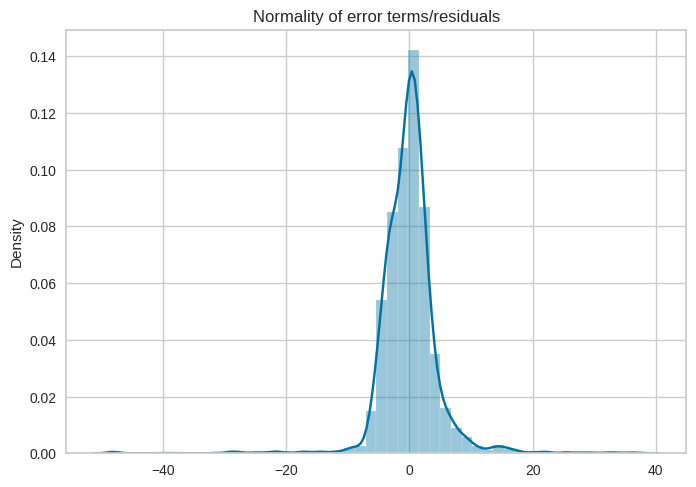

In [ ]:
p = sns.distplot(residuals,kde=True)
p = plt.title('Normality of error terms/residuals')

# **Inference**

* Based on the shape of the distribution in the plot it seems that the residuals are **not perfectly normally distributed**. The peak of the KDE is quite sharp, and there appear to be some deviations from the bell-shaped curve that characterizes a normal distribution.

In [ ]:
mean_residuals = np.mean(residuals)
print("Mean of Residuals {}".format(mean_residuals))

Mean of Residuals 7.026531617137456e-14



(3)Homoscedasticity which means normality of the error distribution.The plot for residuals against target variable should be normally distributed. **From the plot below we can see that it is not perfectly normally distributed and hence the assumption is violated**

(4)There should be no or little auto correlation. Autocorrelation occurs when the residuals (errors) from a regression model are correlated with each other One way to test this is by Durbin-Watson test. The values should be between 1.5-2.5 for no autocorrelation.**From the below calculation we can see that the value is 2.0092 and hence even this assumption is not violated.**

In [ ]:
durbin_watson_statistic = sm.stats.stattools.durbin_watson(residuals)
print("Durbin-Watson Statistic:", durbin_watson_statistic)

Durbin-Watson Statistic: 2.009282679982102


# **Q1.  Is the relationship significant?**

* P value is probability of obtaining a result at least as extreme as the current one, assuming null hypothesis is true.

* A relationship is said to be statistically significant when the p value for the variables is less than 0.05.

We can calculate the p value using the OLS method.

In [ ]:
import statsmodels.api as sm

ind_vars = [
    'Engine Size(L)',
    'Cylinders',
    'Fuel Consumption City (L/100 km)',
    'Fuel Consumption Hwy (L/100 km)',
    'Fuel Consumption Comb (L/100 km)',
    'Fuel Consumption Comb (mpg)',
    'Transmission_A10',
    'Transmission_A4',
    'Transmission_A5',
    'Transmission_A6',
    'Transmission_A7',
    'Transmission_A8',
    'Transmission_A9',
    'Transmission_AM5',
    'Transmission_AM6',
    'Transmission_AM7',
    'Transmission_AM8',
    'Transmission_AM9',
    'Transmission_AS10',
    'Transmission_AS4',
    'Transmission_AS5',
    'Transmission_AS6',
    'Transmission_AS7',
    'Transmission_AS8',
    'Transmission_AS9',
    'Transmission_AV',
    'Transmission_AV10',
    'Transmission_AV6',
    'Transmission_AV7',
    'Transmission_AV8',
    'Transmission_M5',
    'Transmission_M6',
    'Transmission_M7',
    'Fuel Type_D',
    'Fuel Type_E',
    'Fuel Type_N',
    'Fuel Type_X',
    'Fuel Type_Z',
]

# Add the constant term
X = sm.add_constant(data[ind_vars])

# Fit the OLS model
model_p = sm.OLS(data["CO2 Emissions(g/km)"], X).fit()

# Print out the statistics
model_p.summary()


<class 'statsmodels.iolib.summary.Summary'>
"""
                             OLS Regression Results                            
===============================================================================
Dep. Variable:     CO2 Emissions(g/km)   R-squared:                       0.993
Model:                             OLS   Adj. R-squared:                  0.993
Method:                  Least Squares   F-statistic:                 2.952e+04
Date:                 Mon, 18 Mar 2024   Prob (F-statistic):               0.00
Time:                         13:59:36   Log-Likelihood:                -22138.
No. Observations:                 7385   AIC:                         4.435e+04
Df Residuals:                     7348   BIC:                         4.460e+04
Df Model:                           36                                         
Covariance Type:             nonrobust                                         
====================================================================================================
                                       coef    std err          t      P>|t|      [0.025      0.975]
----------------------------------------------------------------------------------------------------
const                               16.7307      1.394     11.998      0.000      13.997      19.464
Engine Size(L)                       0.2820      0.135      2.092      0.037       0.018       0.546
Cylinders                            1.0039      0.095     10.609      0.000       0.818       1.189
Fuel Consumption City (L/100 km)     6.4386      0.739      8.712      0.000       4.990       7.887
Fuel Consumption Hwy (L/100 km)      5.6417      0.609      9.271      0.000       4.449       6.835
Fuel Consumption Comb (L/100 km)     8.0424      1.339      6.004      0.000       5.417      10.668
Fuel Consumption Comb (mpg)         -0.8678      0.025    -34.244      0.000      -0.917      -0.818
Transmission_A10                     3.4093      0.883      3.859      0.000       1.678       5.141
Transmission_A4                     -7.5308      0.643    -11.721      0.000      -8.790      -6.271
Transmission_A5                      0.5047      0.567      0.890      0.373      -0.607       1.616
Transmission_A6                     -0.2344      0.289     -0.812      0.417      -0.800       0.331
Transmission_A7                      2.7075      0.689      3.932      0.000       1.358       4.057
Transmission_A8                      1.5539      0.308      5.049      0.000       0.951       2.157
Transmission_A9                      1.7951      0.334      5.379      0.000       1.141       2.449
Transmission_AM5                     2.1985      2.363      0.931      0.352      -2.433       6.830
Transmission_AM6                     3.0391      0.480      6.325      0.000       2.097       3.981
Transmission_AM7                     1.3545      0.318      4.257      0.000       0.731       1.978
Transmission_AM8                     0.6182      0.638      0.969      0.333      -0.633       1.869
Transmission_AM9                     4.4759      2.724      1.643      0.100      -0.864       9.816
Transmission_AS10                    2.0128      0.425      4.735      0.000       1.179       2.846
Transmission_AS4                    -2.7617      3.320     -0.832      0.405      -9.269       3.745
Transmission_AS5                    -0.6950      0.947     -0.734      0.463      -2.552       1.162
Transmission_AS6                     0.7132      0.257      2.775      0.006       0.209       1.217
Transmission_AS7                     0.0973      0.345      0.282      0.778      -0.579       0.773
Transmission_AS8                     1.0123      0.262      3.860      0.000       0.498       1.526
Transmission_AS9                     0.9563      0.575      1.663      0.096      -0.171       2.084
Transmission_AV                      1.8617      0.383      4.856      0.000       1.110       2.613
Transmission_AV10                   -0.212

# **Importing Data into a h20 dataframe**

In [ ]:
# GitHub raw file URL
url = "https://raw.githubusercontent.com/vaishveerkumar/Data-Science/main/CO2%20Emissions.csv"
df_pd = pd.read_csv(url)

# Convert Pandas DataFrame to H2OFrame
df = h2o.H2OFrame(df_pd)

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


In [ ]:
#Datatypes

df.types

{'Make': 'enum',
 'Model': 'enum',
 'Vehicle Class': 'enum',
 'Engine Size(L)': 'real',
 'Cylinders': 'int',
 'Transmission': 'enum',
 'Fuel Type': 'enum',
 'Fuel Consumption City (L/100 km)': 'real',
 'Fuel Consumption Hwy (L/100 km)': 'real',
 'Fuel Consumption Comb (L/100 km)': 'real',
 'Fuel Consumption Comb (mpg)': 'int',
 'CO2 Emissions(g/km)': 'int'}

In [ ]:
#Checking the no of rows and columns in the dataframe

df.shape

(7385, 12)

# **Creating a 80/20 - train/test split of the dataset**

In [ ]:
pct_rows = 0.80
df_train, df_test = df.split_frame([pct_rows])

print(df_train.shape)
print(df_test.shape)

(5860, 12)
(1525, 12)


In [ ]:
#Displaying all columns in X

X=df.columns
print(X)

['Make', 'Model', 'Vehicle Class', 'Engine Size(L)', 'Cylinders', 'Transmission', 'Fuel Type', 'Fuel Consumption City (L/100 km)', 'Fuel Consumption Hwy (L/100 km)', 'Fuel Consumption Comb (L/100 km)', 'Fuel Consumption Comb (mpg)', 'CO2 Emissions(g/km)']


In [ ]:
#Separting dependant variable from independant

y = "CO2 Emissions(g/km)"
X.remove(y)
print(X)

['Make', 'Model', 'Vehicle Class', 'Engine Size(L)', 'Cylinders', 'Transmission', 'Fuel Type', 'Fuel Consumption City (L/100 km)', 'Fuel Consumption Hwy (L/100 km)', 'Fuel Consumption Comb (L/100 km)', 'Fuel Consumption Comb (mpg)']


# **H20 AutoML Execution**

When aml.train(x=X, y=y, training_frame=df_train) is done- we instruct the AutoML object (aml) to train a set of machine learning models using the features in X to predict the target variable y, using the data provided in the df_train DataFrame.

H2O's AutoML algorithm will automatically try various machine learning models, tune hyperparameters and select the best-performing model based on some predefined performance metric using cross-validation on the provided training data. Once the training is complete, we can access the best model and its performance metrics to make predictions on new data.

In [ ]:
aml = H2OAutoML(max_runtime_secs=run_time, seed=1)  # Setting of AutoML
aml.train(x=X, y=y, training_frame=df_train)

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


key,value
Stacking strategy,cross_validation
Number of base models (used / total),2/6
# GBM base models (used / total),1/1
# XGBoost base models (used / total),1/1
# DRF base models (used / total),0/2
# DeepLearning base models (used / total),0/1
# GLM base models (used / total),0/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5


**A default performance metric for each machine learning task (binary classification, multiclass classification, regression) is specified internally and the leaderboard will be sorted by that metric. In the case of regression, the default ranking metric is mean residual deviance which is the average discrepancy between the observed response values and the response values predicted by the model.**

In [ ]:
bestmodel = aml.leaderboard
print (bestmodel)

model_id                                                    rmse       mse      mae      rmsle    mean_residual_deviance
StackedEnsemble_BestOfFamily_3_AutoML_1_20240318_135943  3.00254   9.01525  2.04016  0.0125134                   9.01525
StackedEnsemble_AllModels_2_AutoML_1_20240318_135943     3.00284   9.01704  2.04029  0.0125125                   9.01704
GBM_5_AutoML_1_20240318_135943                           3.09002   9.54822  2.11832  0.0128876                   9.54822
StackedEnsemble_AllModels_1_AutoML_1_20240318_135943     3.30287  10.909    2.04208  0.0134415                  10.909
StackedEnsemble_BestOfFamily_2_AutoML_1_20240318_135943  3.30663  10.9338   2.04568  0.0134587                  10.9338
XGBoost_2_AutoML_1_20240318_135943                       3.36364  11.3141   2.07009  0.0136499                  11.3141
GBM_4_AutoML_1_20240318_135943                           3.39279  11.511    1.94824  0.0146239                  11.511
GBM_3_AutoML_1_20240318_135943        

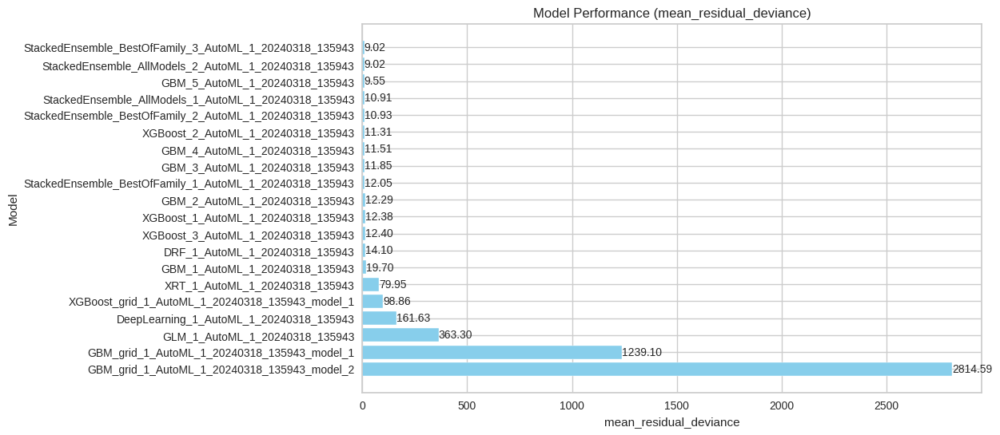

In [ ]:
# Getting the model names and mean_residual_deviance values from the leaderboard
model_names = aml.leaderboard['model_id'].as_data_frame().values.flatten()
mean_residual_deviance = aml.leaderboard['mean_residual_deviance'].as_data_frame().values.flatten().astype(float)

# Plotting the leaderboard
plt.figure(figsize=(10, 6))
bars = plt.barh(model_names, mean_residual_deviance, color='skyblue')

# Adding labels
for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2, f'{bar.get_width():.2f}',
             va='center', ha='left', fontsize=10)

plt.xlabel('mean_residual_deviance')
plt.ylabel('Model')
plt.title('Model Performance (mean_residual_deviance)')

 # to get highest-performing model at the top
plt.gca().invert_yaxis()
plt.show()


# **Visualization of the Training and CV metrics**

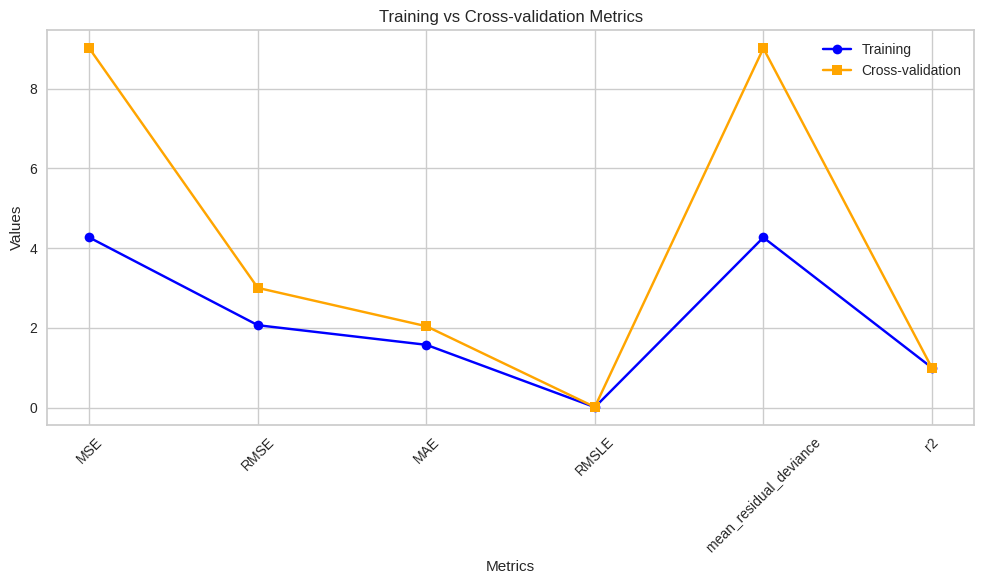

In [ ]:
# Getting the best model
best_model = aml.leader

# training performance metrics
train_perf = best_model.model_performance(train=True)

# cross-validation performance metrics
cv_perf = best_model.model_performance(xval=True)

metrics = ['MSE', 'RMSE', 'MAE', 'RMSLE', 'mean_residual_deviance', 'r2']

train_values = [train_perf.mse(), train_perf.rmse(), train_perf.mae(), train_perf.rmsle(), train_perf.mean_residual_deviance(), train_perf.r2()]
cv_values = [cv_perf.mse(), cv_perf.rmse(), cv_perf.mae(), cv_perf.rmsle(), cv_perf.mean_residual_deviance(), cv_perf.r2()]

positions = range(len(metrics))

plt.figure(figsize=(10, 6))
plt.plot(positions, train_values, marker='o', label='Training', color='blue')
plt.plot(positions, cv_values, marker='s', label='Cross-validation', color='orange')
plt.xlabel('Metrics')
plt.ylabel('Values')
plt.title('Training vs Cross-validation Metrics')
plt.legend()
plt.xticks(positions, metrics, rotation=45)
plt.tight_layout()
plt.show()


# **Inference - Model Performance and Graph**

The data has been divided into 5 folds and the model is trained and evaluated 5 times, each time using a different fold as the validation set and the remaining folds as the training set.

This allows us to assess the variability of the model's performance across different validation sets and provides a more robust estimate of the model's generalization performance compared to using a single train-test split.


**MSE (Mean Squared Error):**

The increase in MSE from training to CV suggests that the model fits the training data slightly better than it generalizes to unseen data.

**RMSE (Root Mean Squared Error):**

The RMSE is higher in CV indicating a loss in accuracy on unseen data.

**MAE (Mean Absolute Error):**

Again the MAE increases slightly in CV showing that the model's average absolute error is slightly higher on unseen data.

**RMSLE (Root Mean Squared Logarithmic Error):**

The increase in RMSLE from training to CV suggests that the model's logarithmic error is slightly higher on unseen data

**Mean Residual Deviance:**

The CV values indicates that the model's goodness of fit is reduced on unseen data

**R-squared:**

The values are high for both training and CV, indicating that the model explains nearly all the variance in both datasets.

**Null degrees of freedom and Residual degrees of freedom:**

These are degrees of freedom for the null model and residual model, respectively. They're related to the model's complexity and fit.

**Null deviance**

The high value suggests a significant potential for improvement when moving from a null model to a model with predictors.

**Residual deviance:**

 Residual Deviance measures the deviance of the fitted model from the actual data. A significant reduction from Null Deviance in both training and CV indicates that the model with predictors provides a substantial improvement in fit. The increase in Residual Deviance from training to CV suggests the model fits the training data better than it does unseen data.

**AIC (Akaike Information Criterion):**

The Null DoF corresponds to the intercept-only model, while the Residual DoF corresponds to the model with predictors. The difference between them indicates the number of predictors used in the model. The consistency of DoF between training and CV data, along with the slight reduction from Null to Residual, confirms the model complexity and the effective utilization of predictors


# **The values for each metric on the cross-validation data indicate of potential overfitting, that is the model performs marginally better on the training data than on the CV data.**

In [ ]:
model_index = 0
glm_index = 0
glm_model = ""
aml_leaderboard_df = aml.leaderboard.as_data_frame()
models_dict = {}
for m in aml_leaderboard_df["model_id"]:
    models_dict[m] = model_index
    if "StackedEnsemble" not in m:
        break
    model_index = model_index + 1

for m in aml_leaderboard_df["model_id"]:
    if "GLM" in m:
        models_dict[m] = glm_index
        break
    glm_index = glm_index + 1
models_dict



{'StackedEnsemble_BestOfFamily_3_AutoML_1_20240318_135943': 0,
 'StackedEnsemble_AllModels_2_AutoML_1_20240318_135943': 1,
 'GBM_5_AutoML_1_20240318_135943': 2,
 'GLM_1_AutoML_1_20240318_135943': 17}

In [ ]:
#print the index value of best model
print(model_index)
best_model1 = h2o.get_model(aml.leaderboard[model_index,'model_id'])

2


In [ ]:
best_model1.algo

'gbm'

# Q8. Which independent variables are significant?

#  Q5. In multivariate models rank the most significant predictor variables and exclude insignificant ones from the model.

* From the above code, we understand that the best model has algorithm GBM-Gradient Boosting Machine. It belongs to the family of boosting algorithms, which iteratively train weak learners and combine them to form a strong learner.

* varimp_plot generates a plot showing the variable importance of the features used in the GBM model. Variable importance indicates how much each feature contributes to the model's performance in terms of predictive accuracy.

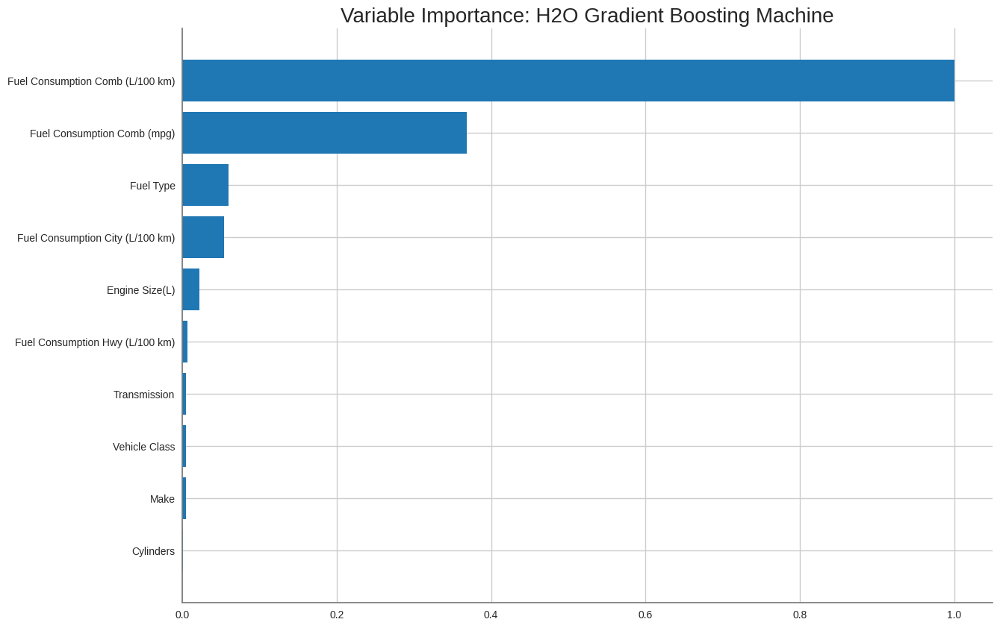

<Figure size 800x550 with 0 Axes>

In [ ]:
#plot variables in order of their importance for price prediction

best_model1.varimp_plot()

# **Variable Importance HeatMap**

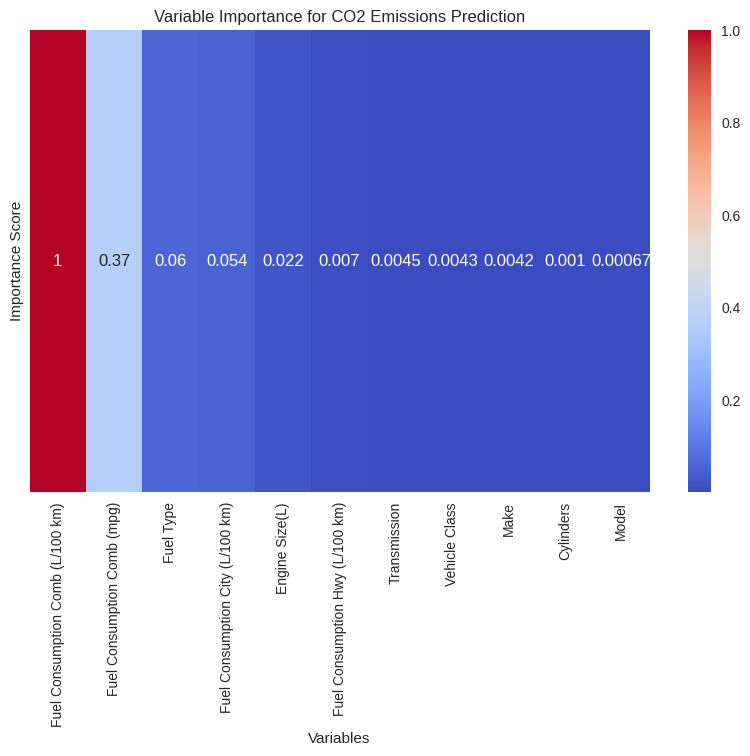

In [ ]:
variable_importance = best_model1.varimp()

# Create a dictionary to store variable importance scores
variable_scores = {var[0]: var[2] for var in variable_importance}

# Sort variables by their importance scores
sorted_variables = sorted(variable_scores.items(), key=lambda x: x[1], reverse=True)

# Extract variable names and scores
variable_names = [var[0] for var in sorted_variables]
scores = [var[1] for var in sorted_variables]

# Create a heatmap
plt.figure(figsize=(10, 6))
sns.heatmap([scores], annot=True, cmap='coolwarm', xticklabels=variable_names, yticklabels=False)
plt.title('Variable Importance for CO2 Emissions Prediction')
plt.xlabel('Variables')
plt.ylabel('Importance Score')
plt.show()

# **Inference- Variable Importance Plot**

1. The Variable importance plot suggests that the **most important predictor: are Fuel Consumption Comb(L/100km), Fuel Consumption Comb(mpg), Fuel Type, Engine Size (L).**

2. While the plot does **not indicate comparetively significant importance for Trasmission and Cylinders, they are considered to be vital for the contribution to CO2 emissions**. But **Make, Model and Vehical Class** serve as identifiers for individual vehicles. Including these columns in the predictive model might not contribute meaningful information to the CO2 emissions as each row represents a unique vehicle. **Hence we can drop these 3 insignificant predictors.**

# **Dropping Columns with least significance**

In [ ]:
columns_to_drop = ["Make", "Model", "Vehicle Class"]

# Drop the specified columns
df = df.drop(columns_to_drop)

In [ ]:
df.head()

Engine Size(L),Cylinders,Transmission,Fuel Type,Fuel Consumption City (L/100 km),Fuel Consumption Hwy (L/100 km),Fuel Consumption Comb (L/100 km),Fuel Consumption Comb (mpg),CO2 Emissions(g/km)
2,4,AS5,Z,9.9,6.7,8.5,33,196
2.4,4,M6,Z,11.2,7.7,9.6,29,221
1.5,4,AV7,Z,6,5.8,5.9,48,136
3.5,6,AS6,Z,12.7,9.1,11.1,25,255
3.5,6,AS6,Z,12.1,8.7,10.6,27,244
3.5,6,AS6,Z,11.9,7.7,10,28,230
3.5,6,AS6,Z,11.8,8.1,10.1,28,232
3.7,6,AS6,Z,12.8,9,11.1,25,255
3.7,6,M6,Z,13.4,9.5,11.6,24,267
2.4,4,AS5,Z,10.6,7.5,9.2,31,212


In [ ]:
df.columns

['Engine Size(L)',
 'Cylinders',
 'Transmission',
 'Fuel Type',
 'Fuel Consumption City (L/100 km)',
 'Fuel Consumption Hwy (L/100 km)',
 'Fuel Consumption Comb (L/100 km)',
 'Fuel Consumption Comb (mpg)',
 'CO2 Emissions(g/km)']

# **AutoML Re-execution after dropping columns**

In [ ]:
#Since we dropped the 3 columns based on variable importance lets define test and train set again.

pctrows = 0.80
df_htrain, df_htest = df.split_frame([pctrows])

print(df_htrain.shape)
print(df_htest.shape)



(5871, 9)
(1514, 9)


In [ ]:
Xh=df.columns
print(Xh)

['Engine Size(L)', 'Cylinders', 'Transmission', 'Fuel Type', 'Fuel Consumption City (L/100 km)', 'Fuel Consumption Hwy (L/100 km)', 'Fuel Consumption Comb (L/100 km)', 'Fuel Consumption Comb (mpg)', 'CO2 Emissions(g/km)']


In [ ]:
yh = "CO2 Emissions(g/km)"
Xh.remove(yh)
print(Xh)

['Engine Size(L)', 'Cylinders', 'Transmission', 'Fuel Type', 'Fuel Consumption City (L/100 km)', 'Fuel Consumption Hwy (L/100 km)', 'Fuel Consumption Comb (L/100 km)', 'Fuel Consumption Comb (mpg)']


In [ ]:
aml1 = H2OAutoML(max_runtime_secs=run_time, seed=1)

In [ ]:
aml1.train(x=Xh,y=yh,training_frame=df_htrain)

AutoML progress: |███████████████████████████████████████████████████████████████| (done) 100%


key,value
Stacking strategy,cross_validation
Number of base models (used / total),3/6
# GBM base models (used / total),1/1
# XGBoost base models (used / total),1/1
# DRF base models (used / total),0/2
# DeepLearning base models (used / total),1/1
# GLM base models (used / total),0/1
Metalearner algorithm,GLM
Metalearner fold assignment scheme,Random
Metalearner nfolds,5


In [ ]:
print(aml1.leaderboard)

model_id                                                    rmse       mse      mae      rmsle    mean_residual_deviance
StackedEnsemble_BestOfFamily_4_AutoML_2_20240318_140335  3.07306   9.44369  1.76395  0.0127898                   9.44369
StackedEnsemble_AllModels_3_AutoML_2_20240318_140335     3.07801   9.47415  1.79324  0.0127678                   9.47415
XGBoost_grid_1_AutoML_2_20240318_140335_model_2          3.09361   9.57043  1.77055  0.0128505                   9.57043
StackedEnsemble_BestOfFamily_3_AutoML_2_20240318_140335  3.32581  11.061    1.99133  0.0140134                  11.061
StackedEnsemble_AllModels_2_AutoML_2_20240318_140335     3.32825  11.0773   1.99122  0.01402                    11.0773
StackedEnsemble_BestOfFamily_2_AutoML_2_20240318_140335  3.35244  11.2389   1.9715   0.0141327                  11.2389
StackedEnsemble_AllModels_1_AutoML_2_20240318_140335     3.35351  11.2461   1.97159  0.014126                   11.2461
GBM_5_AutoML_2_20240318_140335       

# **Visualization of the leaderboard for the re-executed AutoML model**

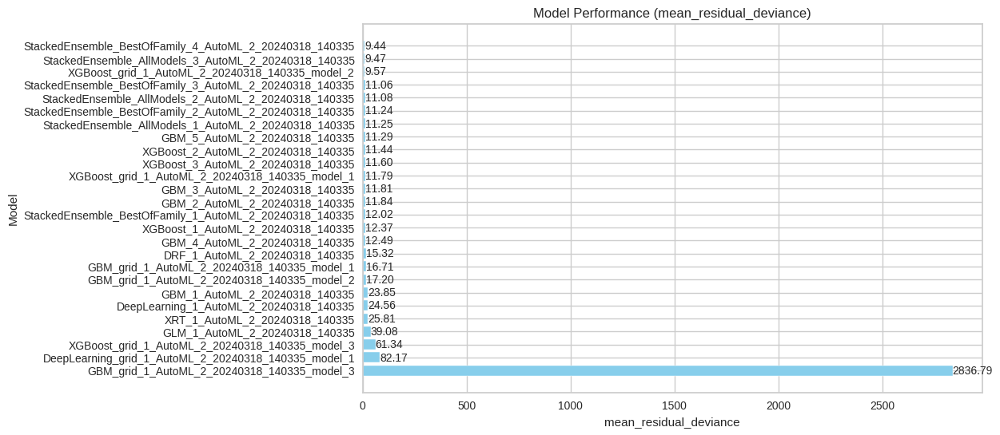

In [ ]:
# Getting the model names and mean_residual_deviance values from the leaderboard
model_names = aml1.leaderboard['model_id'].as_data_frame().values.flatten()
mean_residual_deviance = aml1.leaderboard['mean_residual_deviance'].as_data_frame().values.flatten().astype(float)

# Plotting the leaderboard
plt.figure(figsize=(10, 6))
bars = plt.barh(model_names, mean_residual_deviance, color='skyblue')

# Adding labels
for bar in bars:
    plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2, f'{bar.get_width():.2f}',
             va='center', ha='left', fontsize=10)

plt.xlabel('mean_residual_deviance')
plt.ylabel('Model')
plt.title('Model Performance (mean_residual_deviance)')

 # to get highest-performing model at the top
plt.gca().invert_yaxis()
plt.show()


# **Visualization of the metrics of train and CV (re-excuted AutoML model)**

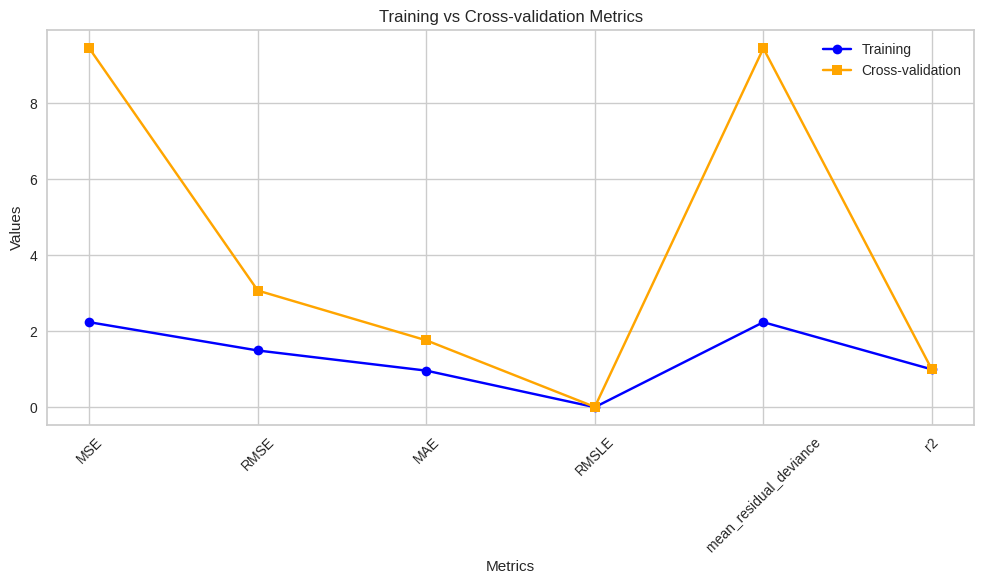

In [ ]:
# Getting the best model
best_model_new = aml1.leader

# training performance metrics
train_perf = best_model_new.model_performance(train=True)

# cross-validation performance metrics
cv_perf = best_model_new.model_performance(xval=True)

metrics = ['MSE', 'RMSE', 'MAE', 'RMSLE', 'mean_residual_deviance', 'r2']

train_values = [train_perf.mse(), train_perf.rmse(), train_perf.mae(), train_perf.rmsle(), train_perf.mean_residual_deviance(), train_perf.r2()]
cv_values = [cv_perf.mse(), cv_perf.rmse(), cv_perf.mae(), cv_perf.rmsle(), cv_perf.mean_residual_deviance(), cv_perf.r2()]

positions = range(len(metrics))

plt.figure(figsize=(10, 6))
plt.plot(positions, train_values, marker='o', label='Training', color='blue')
plt.plot(positions, cv_values, marker='s', label='Cross-validation', color='orange')
plt.xlabel('Metrics')
plt.ylabel('Values')
plt.title('Training vs Cross-validation Metrics')
plt.legend()
plt.xticks(positions, metrics, rotation=45)
plt.tight_layout()
plt.show()


# **Inference**

**Even after dropping the columns with low significance we can see that there is potential overfitting. So we will try and reduce this by using the regularization technique**

# **Visualization of all metrics for the new AML Model on the new testdata- df_htest**

# Leaderboard

> Leaderboard shows models with their metrics. When provided with H2OAutoML object, the leaderboard shows 5-fold cross-validated metrics by default (depending on the H2OAutoML settings), otherwise it shows metrics computed on the frame. At most 20 models are shown by default.

model_id,rmse,mse,mae,rmsle,mean_residual_deviance,training_time_ms,predict_time_per_row_ms,algo
StackedEnsemble_BestOfFamily_4_AutoML_2_20240318_140335,2.37881,5.65875,1.6428,0.00969487,5.65875,462,0.117973,StackedEnsemble
StackedEnsemble_AllModels_3_AutoML_2_20240318_140335,2.38477,5.68714,1.67146,0.00961911,5.68714,1065,0.307039,StackedEnsemble
XGBoost_grid_1_AutoML_2_20240318_140335_model_2,2.39771,5.74901,1.64649,0.00977855,5.74901,1916,0.07902,XGBoost
XGBoost_3_AutoML_2_20240318_140335,2.50132,6.25663,1.85915,0.0101728,6.25663,1611,0.010598,XGBoost
StackedEnsemble_AllModels_2_AutoML_2_20240318_140335,2.52419,6.37154,1.90885,0.00993127,6.37154,627,0.139004,StackedEnsemble
StackedEnsemble_BestOfFamily_3_AutoML_2_20240318_140335,2.52436,6.37238,1.91002,0.00992815,6.37238,601,0.124689,StackedEnsemble
GBM_5_AutoML_2_20240318_140335,2.55172,6.51125,1.92937,0.0100409,6.51125,1021,0.187645,GBM
StackedEnsemble_BestOfFamily_2_AutoML_2_20240318_140335,2.66633,7.10929,1.81292,0.0113223,7.10929,900,0.549449,StackedEnsemble
StackedEnsemble_AllModels_1_AutoML_2_20240318_140335,2.6707,7.13263,1.81379,0.0113529,7.13263,2036,0.533238,StackedEnsemble
XGBoost_2_AutoML_2_20240318_140335,2.69293,7.25189,1.82755,0.0114342,7.25189,1570,0.014578,XGBoost


# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

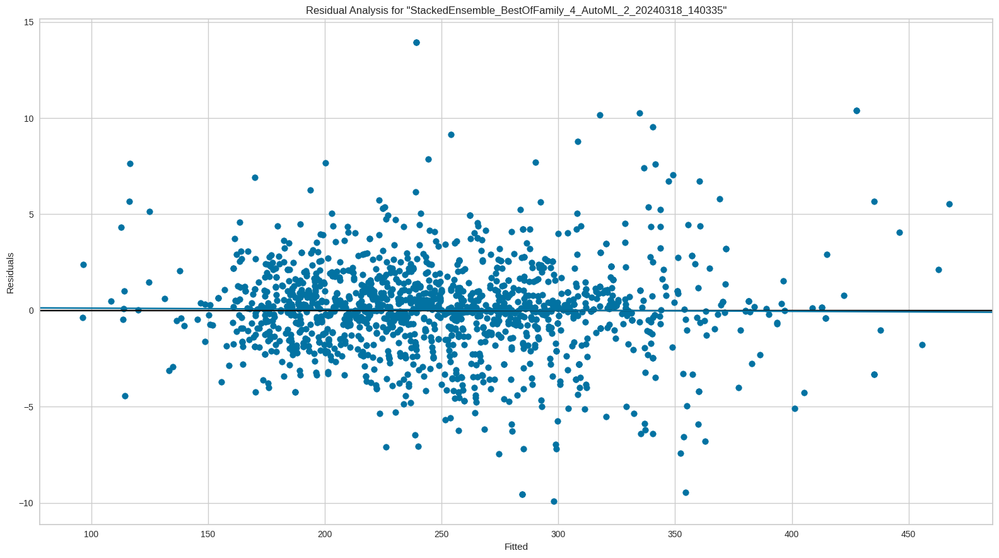

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

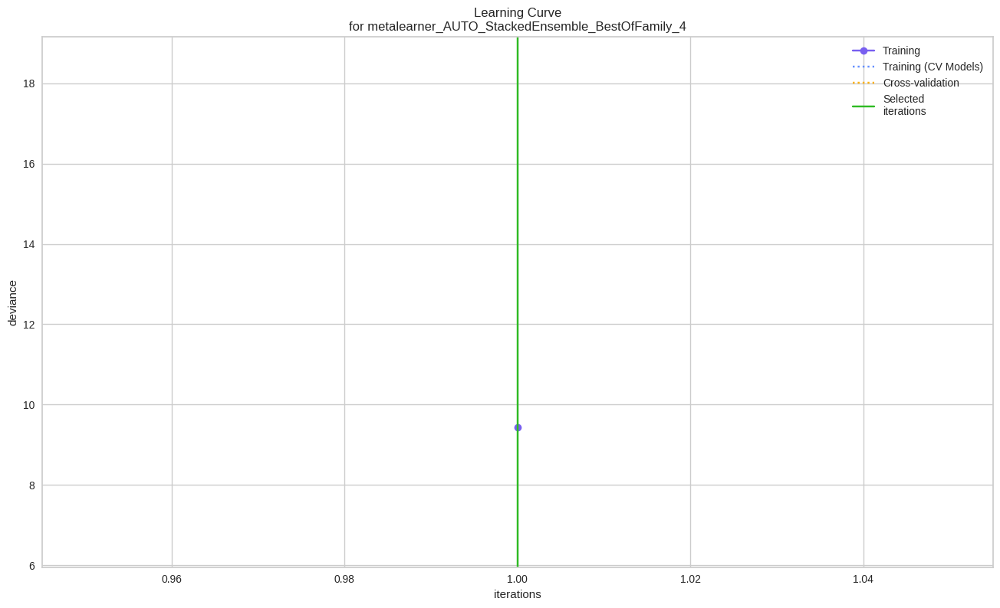

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

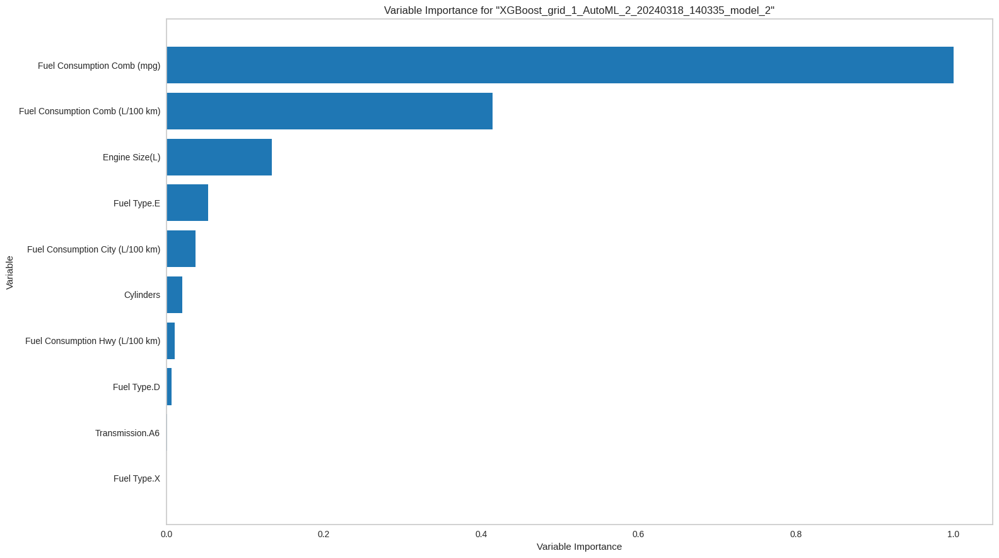

# Variable Importance Heatmap

> Variable importance heatmap shows variable importance across multiple models. Some models in H2O return variable importance for one-hot (binary indicator) encoded versions of categorical columns (e.g. Deep Learning, XGBoost). In order for the variable importance of categorical columns to be compared across all model types we compute a summarization of the the variable importance across all one-hot encoded features and return a single variable importance for the original categorical feature. By default, the models and variables are ordered by their similarity.

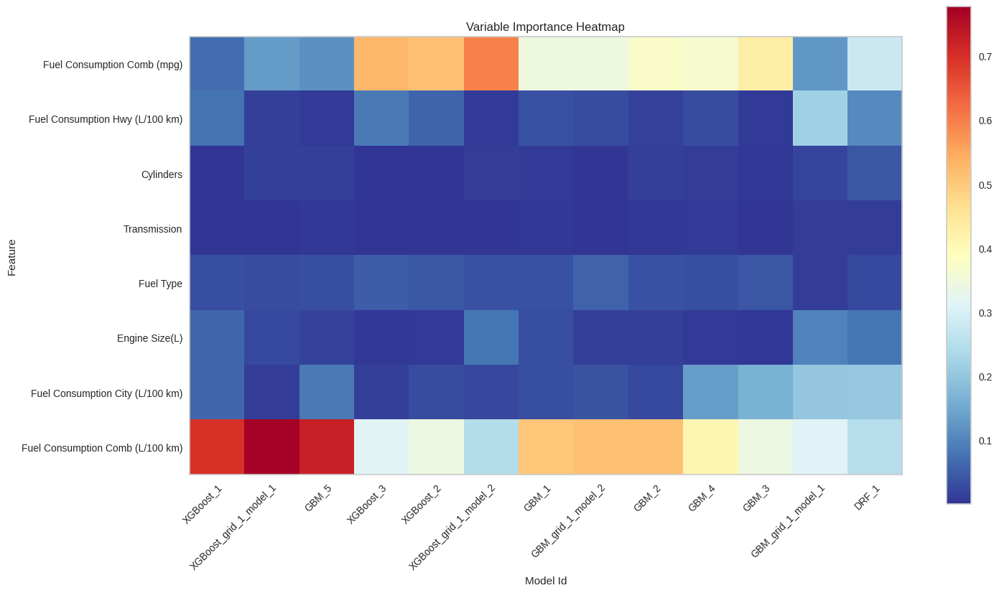

# Model Correlation

> This plot shows the correlation between the predictions of the models. For classification, frequency of identical predictions is used. By default, models are ordered by their similarity (as computed by hierarchical clustering). Interpretable models, such as GAM, GLM, and RuleFit are highlighted using red colored text.

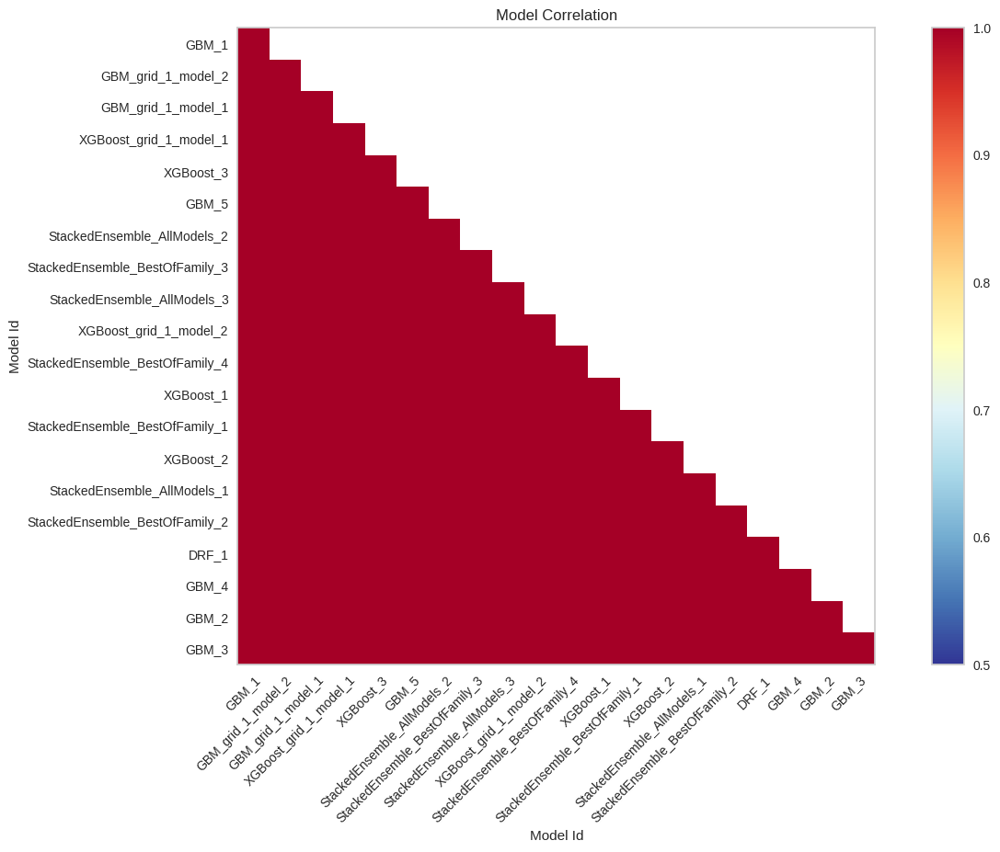

# SHAP Summary

> SHAP summary plot shows the contribution of the features for each instance (row of data). The sum of the feature contributions and the bias term is equal to the raw prediction of the model, i.e., prediction before applying inverse link function.

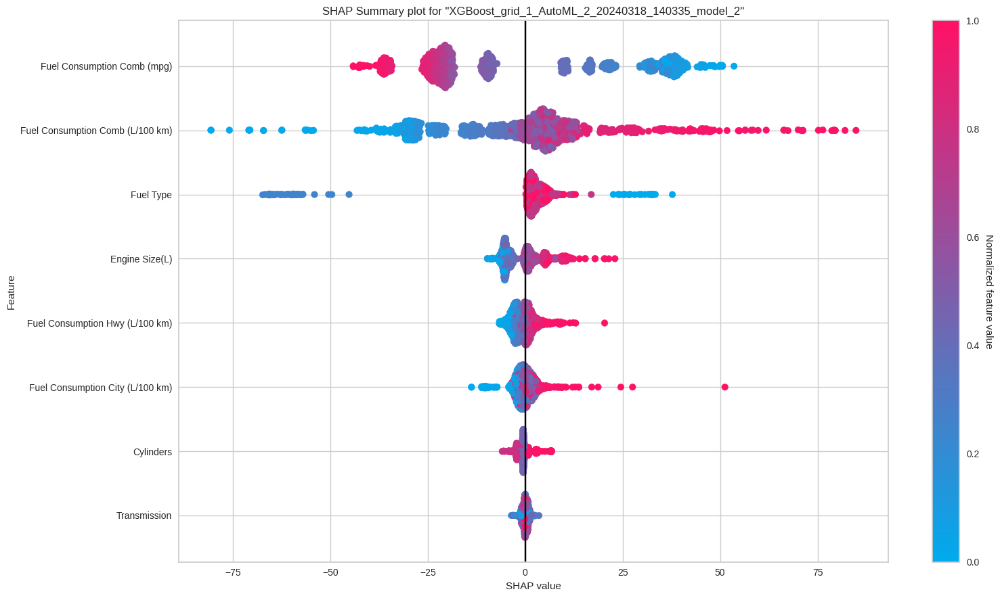

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

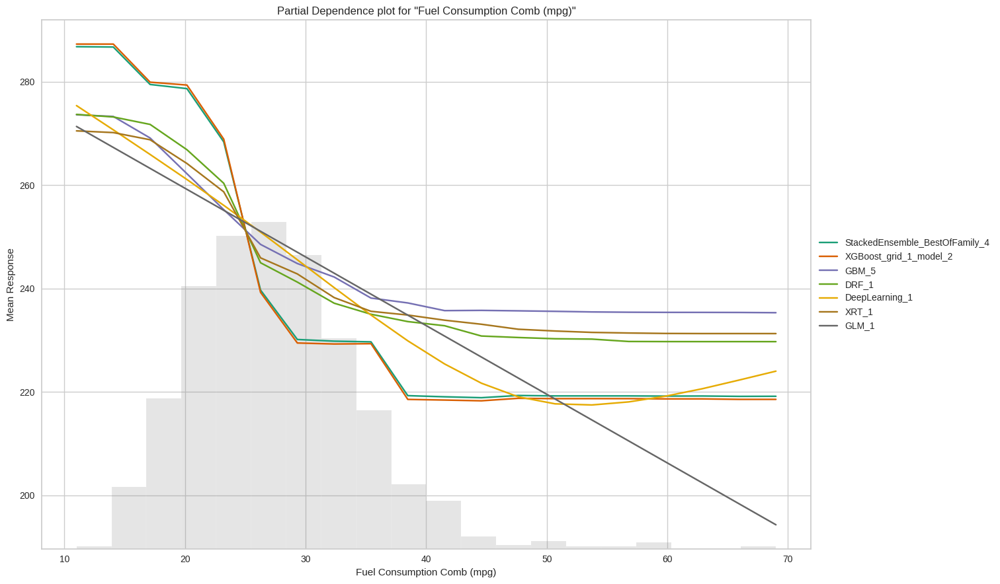

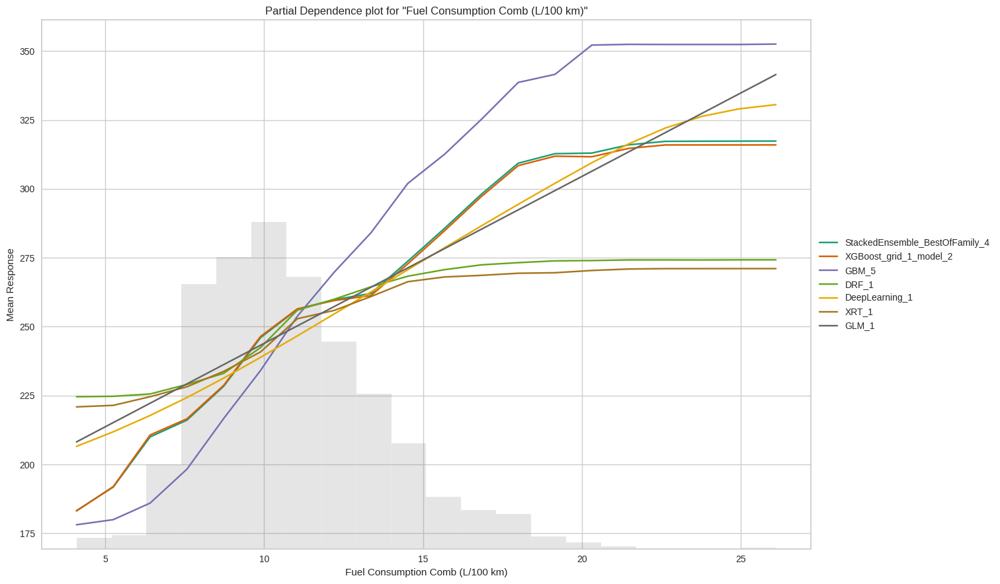

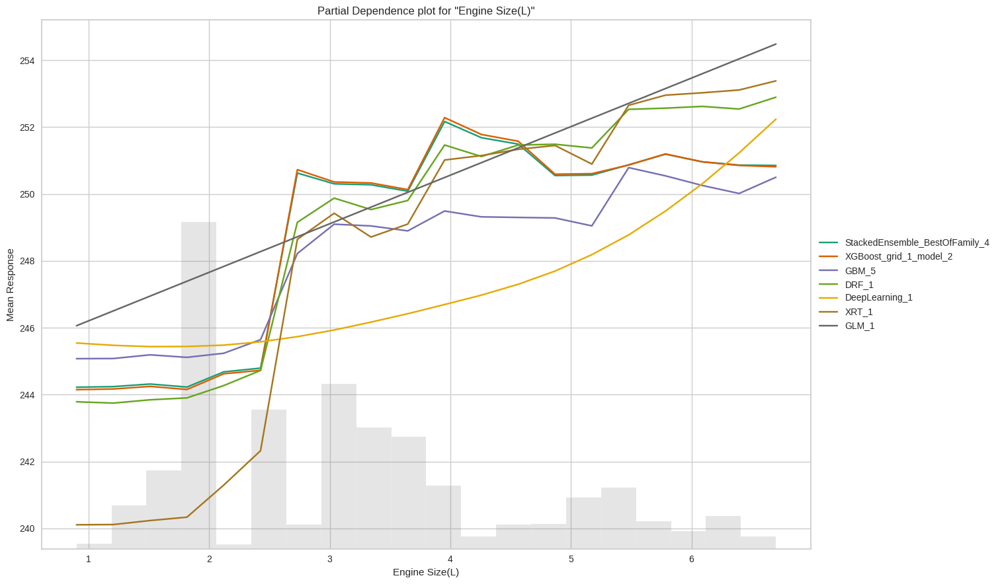

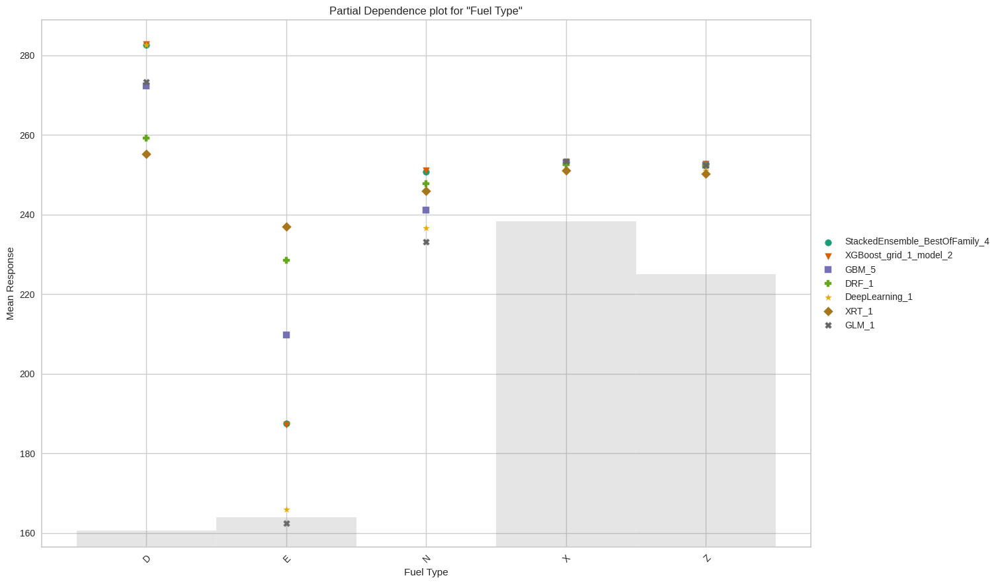

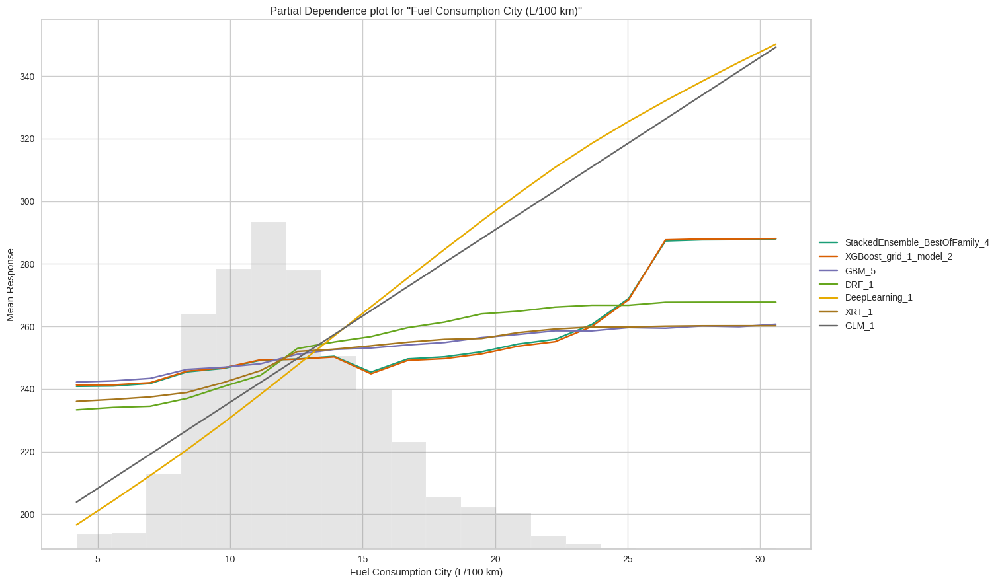

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

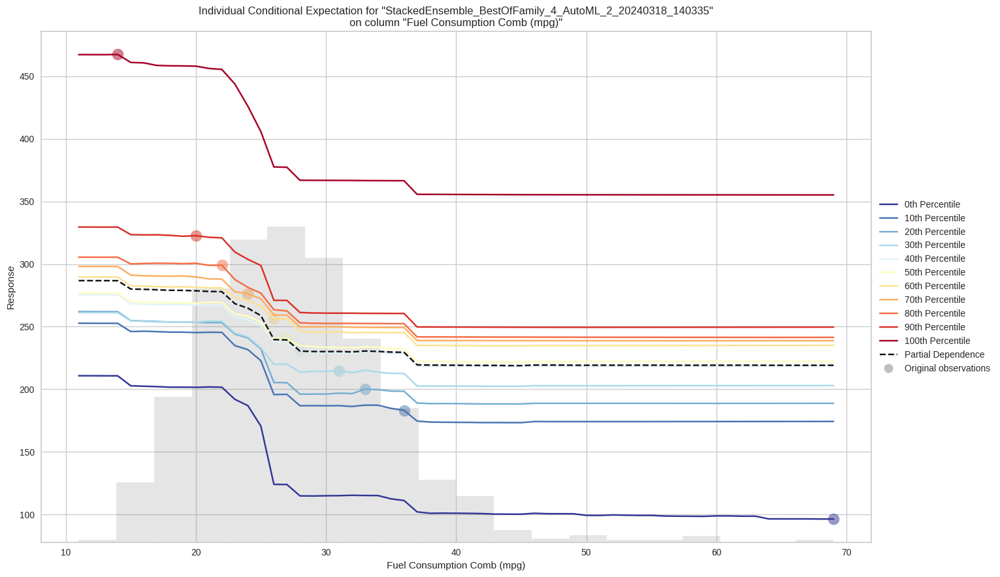

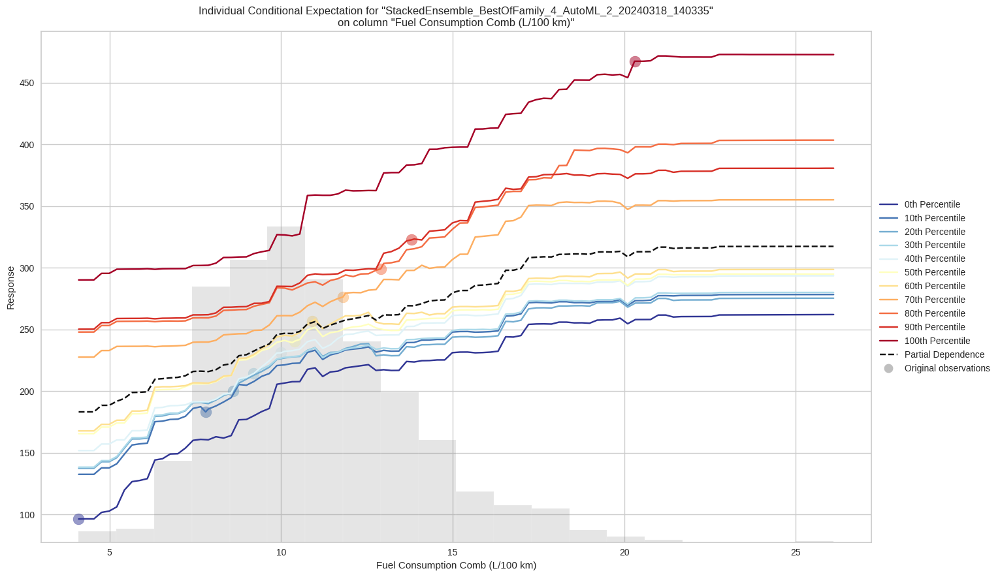

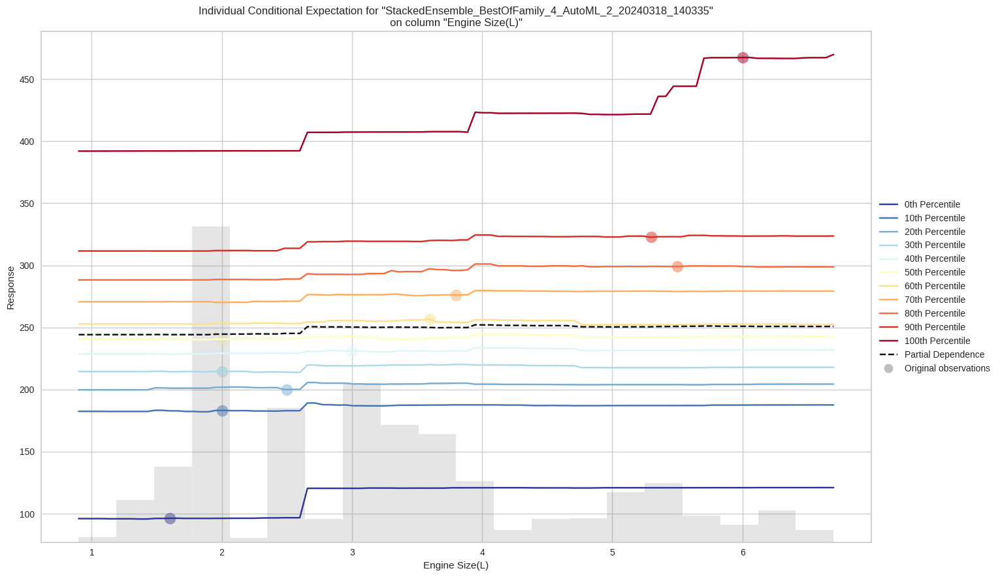

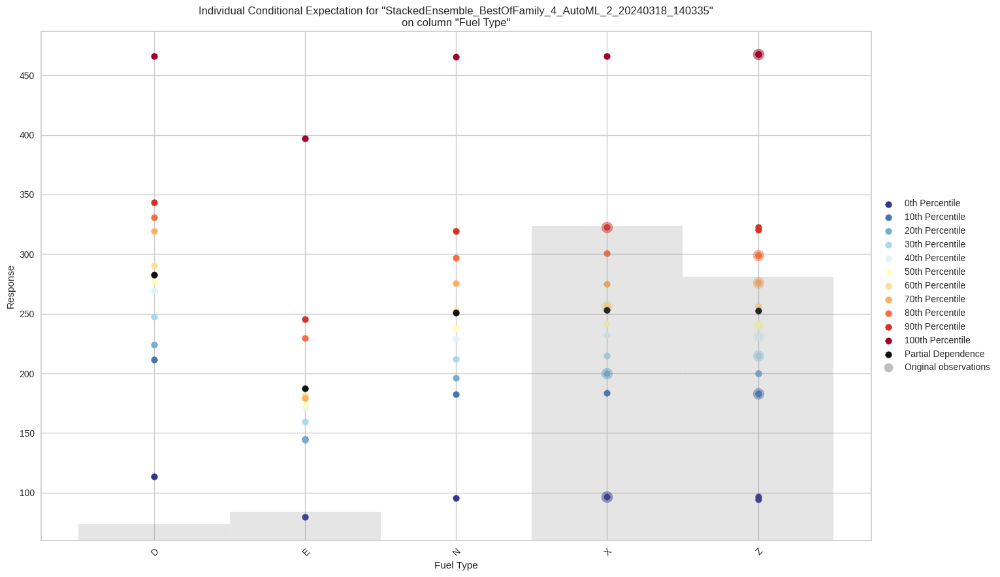

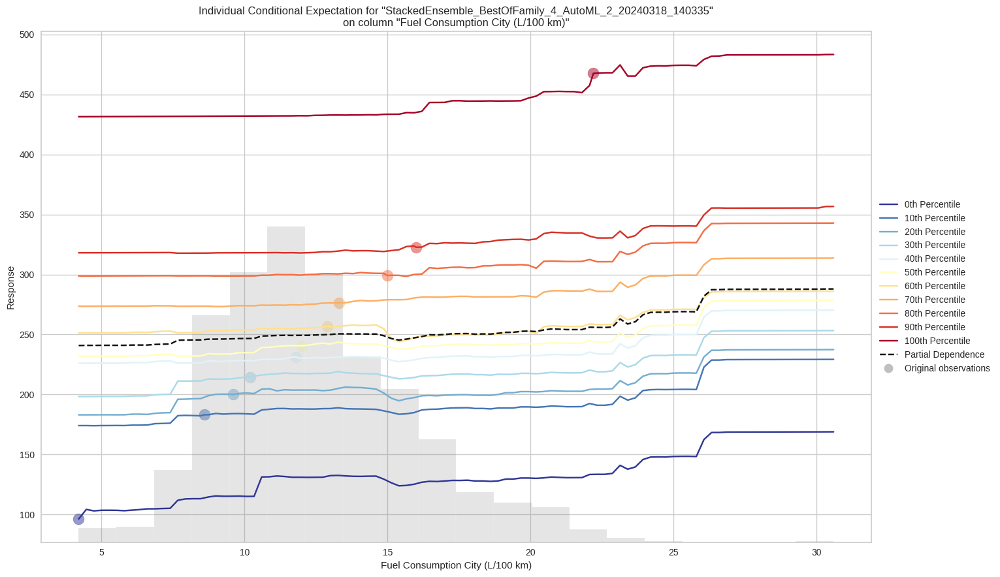

In [ ]:
exa = aml1.explain(df_htest)

# **Inference**

**Residual Analysis**
  * The residuals are reasonably well distributed, with a concentration around the zero line.
  * There are some points that deviate significantly from zero and may indicate potential outliers or that the model might not be as accurate in that high range.

**Learning Curve Plot**
  * There isnt a curve visible in the plot possibly indicating that it shows the outcome of one single iteration

**SHAP Summary**

  * The SHAP value indicates the impact of a feature on the model's output. The position on the X-axis represents the effect of that feature value on the prediction made by the model.
  * A value of 0 would mean the feature has no impact. A value to the right (positive) suggests the feature is pushing the prediction higher, and a value to the left (negative) indicates the feature is pushing the prediction lower.

**Partial Dependency Plot**
  * Mean response for different values of a feature means how the model's predictions change on average as that feature's values change, while all other features are held constant. .
  
  * Gray bars at the bottom of the plot represent the distribution of the features in the dataset.

  * The vertical length of the lines indicates the size of the confidence interval. A longer line suggests a larger interval and thus more uncertainty or variability in the predictions for that category of the feature.

  * The dot in the middle of the interval represents the estimated mean response for that category of the feature when all other features in the model are held constant.

**Individual Conditional Expectation Plot**
  * Colored Dots: Each dot represents an observation from the dataset at different percentiles of the response distribution for a given fuel type. The color of the dot indicates which percentile of the response it represents, with blue being lower percentiles (e.g., 0th or 10th) and red being higher percentiles (e.g., 90th or 100th). This means that each vertical line of dots is showing how the response varies across all observations that have the same fuel type.

  * Gray Dots: These are the original observations for each feature, providing a baseline for comparison.

  * Black Dots: These dots, located in the center of the color spectrum for each feature, represent the average prediction for that feature.

  * Variablity: The spread between the lines or dots at each level indicates variability in the predictions across different observations. If the lines or dots are widely spread, it suggests different observations have quite different predicted responses even at the same level.

  * Percentiles: If the warmer colored lines (representing higher percentiles) are consistently at the top, and the cooler colored lines (representing lower percentiles) are at the bottom it indicates a consistent trend across all percentiles.


# **Q7. Does regularization help?**

 # **Regularization**

Regularization is a technique used to prevent overfitting by imposing a penalty on the size of the coefficients. It can be applied using various methods, but one of the most common ways is through Generalized Linear Models (GLMs) that include regularization terms.

GLMs with regularization typically include one or both of the following penalties:

1. L1 regularization (Lasso regression): Adds a penalty equal to the absolute value of the magnitude of coefficients. This can lead to some coefficients being zero, hence it can also be used for feature selection.

2. L2 regularization (Ridge regression): Adds a penalty equal to the square of the magnitude of coefficients. All coefficients are shrunk by the same factor (none are eliminated).

3. There's also Elastic Net regularization which is a combination of L1 and L2 regularization. It adds both penalties to the loss function.

  In H2O's GLM, we can specify the alpha parameter to control the mix of L1 and L2 regularization:

  **alpha = 1: The penalty is equivalent to Lasso, which is an L1 penalty.**
  
  **alpha = 0: The penalty is equivalent to Ridge, which is an L2 penalty.**

  **0 < alpha < 1: The penalty is a combination of L1 and L2 (Elastic Net).**

4. Lambda search is a process of finding the optimal value for the lambda parameter. It involves trying out a range of lambda values and selecting the one that results in the best model performance based on a chosen metric or criteria.For each lambda value, the model is trained and evaluated using cross-validation or a hold-out validation set.

In [ ]:
from h2o.estimators.glm import H2OGeneralizedLinearEstimator

emission_glm = H2OGeneralizedLinearEstimator(
    family="gaussian", lambda_=0, compute_p_values=True, nfolds=5)

# RIDGE Regularization
emission_glm_regularization_ridge = H2OGeneralizedLinearEstimator(
    family="gaussian", alpha=0, nfolds=5)

# LASSO Regularization
emission_glm_regularization_lasso = H2OGeneralizedLinearEstimator(
    family="gaussian", alpha=1, nfolds=5)

The above code is creating two generalized linear regression models using the H2O machine learning platform with different regularization methods: Ridge and Lasso.

1. The first model- "emission_glm_regularization_ridge," is using Ridge regularization. The "family" argument is set to "gaussian," which means that the response variable is continuous and the model is using a normal (Gaussian) error distribution. The "alpha" argument is set to 0, which means that the model is using Ridge regularization. The "nfolds" argument is set to 5, which means that the model is using 5-fold cross-validation to evaluate the performance of the model.

2. The second model, "emission_glm_regularization_lasso," is using Lasso regularization. The "family" and "nfolds" arguments are the same as in the Ridge model, but the "alpha" argument is set to 1, which means that the model is using Lasso regularization.

# **Generalized Regualrization Model**

In [ ]:
emission_glm.train(x=Xh, y=yh, training_frame=df_htrain)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


,family,link,regularization,number_of_predictors_total,number_of_active_predictors,number_of_iterations,training_frame
,gaussian,identity,None,36,36,1,py_13_sid_aa1d
,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
aic,7262.8433,310.83862,7483.9194,7700.723,7029.9487,7070.613,7029.0127
loglikelihood,0.0,0.0,0.0,0.0,0.0,0.0,0.0
mae,3.0506907,0.0779822,2.9659615,3.1678038,3.0238047,3.0112507,3.0846322
mean_residual_deviance,26.869556,4.3227606,26.423866,34.248905,23.256586,24.33612,26.082302
mse,26.869556,4.3227606,26.423866,34.248905,23.256586,24.33612,26.082302
null_deviance,4057769.0,157267.6,4202404.0,4241787.5,3897126.8,3927771.2,4019755.5
r2,0.9922319,0.0011020,0.9923789,0.9903129,0.9930654,0.9927991,0.9926028
residual_deviance,31601.908,5573.227,32025.727,40995.938,27024.152,28229.9,29733.824


# **Inference**

1. No regularization was applied because this is a standard GLM without L1 or L2 penalties.

2. The model used all available predictors (36 total) and all were active, suggesting no features were discarded during the modeling process.

**Training Performance**:

1. The model has a very high R-squared value of approximately 0.993 on the training data indicating that it explains almost all the variance in the CO2 emissions.

2. The Residual Deviance is significantly lower than the Null Deviance, indicating that the model provides a good fit to the data compared to the null model (which only includes the intercept).

3. The Mean Squared Error (MSE) and Root Mean Squared Error (RMSE) are relatively low, further confirming the model's good performance on the training set.

**Cross-Validation Performance**:

1. The model also performed well on cross-validation with a high R-squared of approximately 0.992 suggesting that the model generalizes well.

2. Cross-validation MSE and RMSE are slightly higher than the training values

**Variable Importances**:

1. The top variables contributing to the model are related to fuel type and fuel consumption which makes sense as these are to have a significant impact on CO2 emissions.Fuel Type E is the most important predictor followed by other fuel types and consumption metrics.

# **Ridge Regularization**

In [ ]:
emission_glm_regularization_ridge.train(x=Xh, y=yh, training_frame=df_htrain)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


,family,link,regularization,number_of_predictors_total,number_of_active_predictors,number_of_iterations,training_frame
,gaussian,identity,Ridge ( lambda = 0.05398 ),38,38,1,py_13_sid_aa1d
,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
aic,9483.806,376.7621,9380.757,9682.607,9640.587,8877.335,9837.74
loglikelihood,0.0,0.0,0.0,0.0,0.0,0.0,0.0
mae,8.765182,0.3196391,8.73315,8.962376,8.799545,8.248478,9.082359
mean_residual_deviance,176.1187,10.026982,167.33516,180.86983,176.9782,165.52596,189.88432
mse,176.1187,10.026982,167.33516,180.86983,176.9782,165.52596,189.88432
null_deviance,4060564.2,251445.03,3885725.2,4271642.0,4032571.0,3758986.8,4353896.0
r2,0.9489167,0.0014756,0.9495750,0.949232,0.9475957,0.9508754,0.9473057
residual_deviance,207063.36,17939.57,195614.8,216139.44,211134.98,183237.23,229190.39


# **Inference**

The model includes Ridge regularization which is applied to all 38 predictors as seen by the equal number of total and active predictors. In this Ridge regularization no features were eliminated.

**Training Performance:**
1. The model has a high r squared value of about 0.955 which suggests that it can explain a significant proportion of the variance in the CO2 emissions on the training data.

2. The MSE, RMSE, and MAE are measures of the model's average prediction error. and are higher as compared to General Regularization.

**Cross-Validation Performance:**

1. The cross-validated r squared value is slightly lower than the training, which is expected and suggests a good generalization to unseen data.

2. Cross-validated MSE, RMSE, and MAE are higher than the training errors, indicating the model's not so good performance on unseen data.

**Variable Importances:**

1. The model indicates that 'Fuel Type.E', 'Fuel Consumption Comb (mpg)', and other consumption metrics are important predictors.

# **Lasso Regularization**

In [ ]:
emission_glm_regularization_lasso.train(x=Xh, y=yh, training_frame=df_htrain)

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


,family,link,regularization,number_of_predictors_total,number_of_active_predictors,number_of_iterations,training_frame
,gaussian,identity,Lasso (lambda = 0.05398 ),38,11,1,py_13_sid_aa1d
,mean,sd,cv_1_valid,cv_2_valid,cv_3_valid,cv_4_valid,cv_5_valid
aic,7224.344,342.06744,7555.9834,6814.8286,7552.8906,7258.6836,6939.3345
loglikelihood,0.0,0.0,0.0,0.0,0.0,0.0,0.0
mae,3.1674283,0.1132909,3.303439,3.023635,3.2569222,3.1467767,3.1063685
mean_residual_deviance,27.384691,5.8862333,35.478165,20.210642,29.650925,28.180344,23.403385
mse,27.384691,5.8862333,35.478165,20.210642,29.650925,28.180344,23.403385
null_deviance,4056667.8,108880.9,3921335.0,3979703.5,4152806.0,4054777.5,4174717.0
r2,0.9920446,0.0018770,0.9893658,0.9940980,0.9913673,0.9918612,0.9935305
residual_deviance,32205.254,7191.379,41686.844,23484.766,35847.97,32999.184,27007.506


# **Inference**

The model used LASSO regularization which has reduced the number of active predictors from the total of 38 . **This means LASSO has effectively performed feature selection by setting some coefficient values to zero.**

**Training Performance:**

1. The model has a high R squared value of approximately 0.992 indicating that it can explain a large proportion of the variance in the training data.

2. MSE and RMSE: The Mean Squared Error and Root Mean Squared Error are measures of the model's average error magnitude and values indicate the typical error magnitude of the model's predictions.

**Cross-Validation Performance:**

1. The R squared value on cross-validation is similar to the training (0.992), suggesting that the model generalizes well to unseen data.

2. Cross-Validation MSE and RMSE: These are slightly lower than the training

**Variable Importances:**

1.  The LASSO regularization has identified 'Fuel Type.E', 'Fuel Type.D' and various 'Fuel Consumption' metrics as the most important predictors

2. Several transmission types and fuel types have a relative importance of zero meaning LASSO has eliminated them from the model



# **VISUALIZATION OF RMSE VALUES FOR ALL 3 REGULARIZATION METHODS**

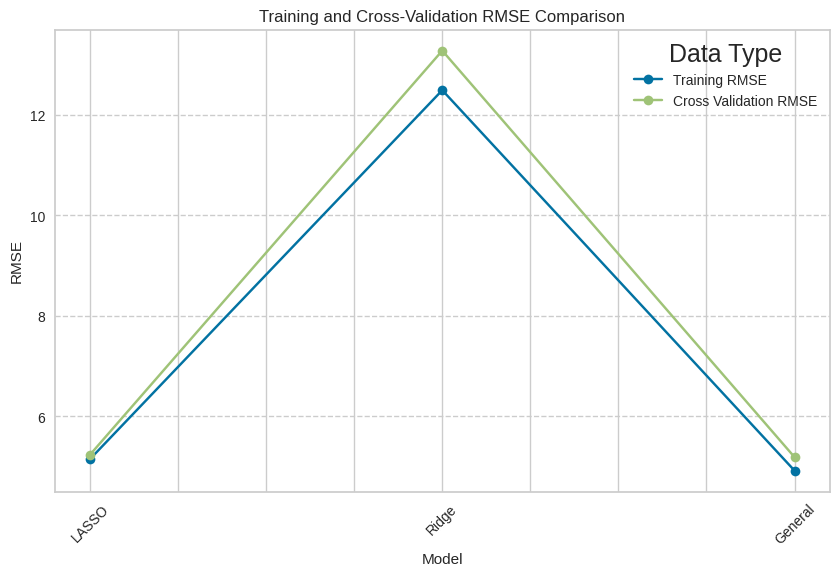

In [ ]:
# Extracting RMSE for Training and Cross-Validation for each model
models = [emission_glm_regularization_lasso, emission_glm_regularization_ridge, emission_glm]
model_names = ['LASSO', 'Ridge', 'General']
training_rmse = []
cv_rmse = []

for model in models:
    # Training RMSE
    training_rmse.append(model.model_performance(train=True).rmse())

    # Cross Validation RMSE
    cv_rmse.append(model.model_performance(xval=True).rmse())


# DataFrame with the extracted metrics
regularization_performance = pd.DataFrame({
    'Model': model_names,
    'Training RMSE': training_rmse,
    'Cross Validation RMSE': cv_rmse
})

regularization_performance.set_index('Model', inplace=True)

# Plotting
regularization_performance.plot(kind='line', marker='o', figsize=(10, 6))
plt.title('Training and Cross-Validation RMSE Comparison')
plt.ylabel('RMSE')
plt.xlabel('Model')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--')
plt.legend(title='Data Type')
plt.show()


# **Conclusion for Regularization**

* Based on these values the general GLM without regularization and the Lasso regularization models have higher R squared values compared to the Ridge regularization model indicating a better fit to the variance in the data.

* But, **the Lasso regularization model slightly outperforms the general GLM model in terms of maintaining high R squared values while also providing with feature selection benefits by reducing the model to 11 active predictors.**

# **Lambda Search- On Test Data**

The purpose of performing a lambda search is to find the optimal value of lambda that balances the trade-off between model complexity and goodness of fit to the data.

This is done through techniques like cross-validation where the dataset is split into training and validation sets and the model is trained and evaluated on different values of lambda to find the one that minimizes the prediction error on the validation set.

Once the lambda search is completed, we get the optimal value of lambda that  can then be used to train the final regularized regression model.

 **Since from the above regularization techniques , we infered that Lasso regularization performed better of all 3 we will apply same Lasso regularization to find optimal lambda value**

In [ ]:
# Lambda Search
emission_regularization_lasso_lambda_search = H2OGeneralizedLinearEstimator(lambda_search=True,alpha=1.0)

lambda_search = emission_regularization_lasso_lambda_search.train(x=Xh, y=yh, training_frame=df_htest)

lambda_search

glm Model Build progress: |██████████████████████████████████████████████████████| (done) 100%


Model Details
=============
H2OGeneralizedLinearEstimator : Generalized Linear Modeling
Model Key: GLM_model_python_1710770333822_46


GLM Model: summary
    family    link      regularization              lambda_search                                                                 number_of_predictors_total    number_of_active_predictors    number_of_iterations    training_frame
--  --------  --------  --------------------------  ----------------------------------------------------------------------------  ----------------------------  -----------------------------  ----------------------  ----------------
    gaussian  identity  Lasso (lambda = 0.005313 )  nlambda = 100, lambda.max = 53.131, lambda.min = 0.005313, lambda.1se = -1.0  38                            30                             100                     py_14_sid_aa1d

ModelMetricsRegressionGLM: glm
** Reported on train data. **

MSE: 18.859380273460836
RMSE: 4.342738798668512
MAE: 2.7559247964663016
RMSLE: 0.019208136833382603
Mean Residual Deviance: 18.859380273460836
R^2: 0.9942847754237334
Null degrees of freedom: 1513
Residual degrees of freedom: 1483
Null deviance: 4995971.96103038
Residual deviance: 28553.101734019703
AIC: 8807.179650423683

Scoring History: 
     timestamp            duration    iteration    lambda    predictors    deviance_train      alpha    iterations    training_rmse      training_deviance    training_mae        training_r2
---  -------------------  ----------  -----------  --------  ------------  ------------------  -------  ------------  -----------------  -------------------  ------------------  ------------------
     2024-03-18 14:10:54  0.000 sec   1            .53E2     1             3299.8493798087047  1.0
     2024-03-18 14:10:54  0.003 sec   2            .48E2     2             2820.2492763014657  1.0
     2024-03-18 14:10:54  0.004 sec   3            .44E2     3             2421.672418381778   1.0
     2024-03-18 14:10:54  0.007 sec   4            .4E2      3             2090.048241553742   1.0
     2024-03-18 14:10:54  0.008 sec   5            .37E2     4             1806.1706846260724  1.0
     2024-03-18 14:10:54  0.010 sec   6            .33E2     4             1570.3386841055838  1.0
     2024-03-18 14:10:54  0.011 sec   7            .3E2      4             1374.5474817890138  1.0
     2024-03-18 14:10:54  0.013 sec   8            .28E2     5             1201.3899925936953  1.0
     2024-03-18 14:10:54  0.016 sec   9            .25E2     5             1053.0632537840772  1.0
     2024-03-18 14:10:54  0.017 sec   10           .23E2     6             928.6146996231403   1.0
---  ---                  ---         ---          ---       ---           ---                 ---      ---           ---                ---                  ---                 ---
     2024-03-18 14:10:54  0.140 sec   91           .12E-1    23            18.97078240631318   1.0
     2024-03-18 14:10:54  0.143 sec   92           .11E-1    25            18.95348674667165   1.0
     2024-03-18 14:10:54  0.145 sec   93           .1E-1     25            18.937624255448696  1.0
     2024-03-18 14:10:54  0.147 sec   94           .93E-2    27            18.921517740221525  1.0
     2024-03-18 14:10:54  0.149 sec   95           .85E-2    27            18.906645204532335  1.0
     2024-03-18 14:10:54  0.151 sec   96           .77E-2    27            18.894300818384245  1.0
     2024-03-18 14:10:54  0.153 sec   97           .7E-2     27            18.884054046493304  1.0
     2024-03-18 14:10:54  0.155 sec   98           .64E-2    28            18.874677229726803  1.0
     2024-03-18 14:10:54  0.157 sec   99           .58E-2    28            18.866805724120518  1.0
     2024-03-18 14:10:54  0.158 sec   100          .53E-2    31            18.859380273455987  1.0      100           4.342738798668512  18.859380273460836   2.7559247964663016  0.9942847754237334
[100 rows x 13 columns]


Variable Importances: 
variable                          relative_importanc

# **Inference from Lambda Search**

**Lambda**: This refers to the regularization parameter used in Lasso regression. In this case, **optimal value found for lambda is 0.005**. This indicates the strength of the penalty applied to the coefficients.

**nlambda**: This parameter specifies the number of lambda values or regularization strengths to be used during the lambda search process. In this case **100** different lambda values were considered.

**lambda.max**: This represents the maximum lambda value considered during the search process.

**lambda.min**: This represents the minimum lambda value considered during the search process. It was set to the same value as the specified lambda, indicating that lambda.min is equal to the specified lambda value - 0.0054.

**lambda.1se**: This parameter represents the lambda value selected based on the one-standard-error rule during the lambda search process. It was set to -1.0 indicating that this rule was not applied or the value was not selected.

# **Using this Lasso regularization with optimum labda value model we can now make predictions**

In [ ]:
# Make predictions on the test data
predictions = lambda_search.predict(df_htest)

# Display the predictions
yh_pred = h2o.as_list( predictions)
print(yh_pred)


glm prediction progress: |███████████████████████████████████████████████████████| (done) 100%
         predict
0     235.114844
1     228.193632
2     355.671355
3     339.121761
4     217.070997
...          ...
1509  272.787629
1510  366.425469
1511  161.817642
1512  203.834718
1513  219.603884

[1514 rows x 1 columns]


In [ ]:
actual_values = h2o.as_list(df_htest[y])  # Real Answers
actual_values

,CO2 Emissions(g/km)
0,230
1,225
2,354
3,338
4,214
...,...
1509,274
1510,371
1511,165
1512,203


# **Visualizing- actual VS predicted values of Lasso regularization with optimum lambda model on test data**

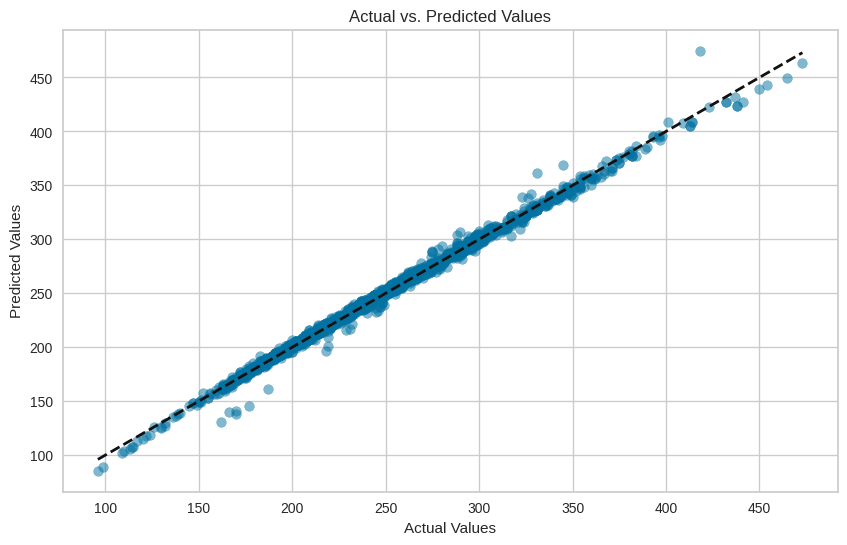

In [ ]:
plt.figure(figsize=(10, 6))
plt.scatter(actual_values['CO2 Emissions(g/km)'], yh_pred['predict'], alpha=0.5)
plt.plot([actual_values.min(), actual_values.max()], [actual_values.min(), actual_values.max()], 'k--', lw=2)  # Diagonal line for reference
plt.xlabel('Actual Values')
plt.ylabel('Predicted Values')
plt.title('Actual vs. Predicted Values')
plt.show()


# **Inference**

* The closer the points are to the dashed diagonal line, the better the model's predictions are.

* The points are clustered closely around the diagonal line, which suggests that the model's predictions are generally close to the actual values. This indicates a good fit.

* The model appears to be consistent across the range of values, as there are no obvious patterns of deviation from the diagonal line. This suggests that the model predicts equally well for lower and higher values.

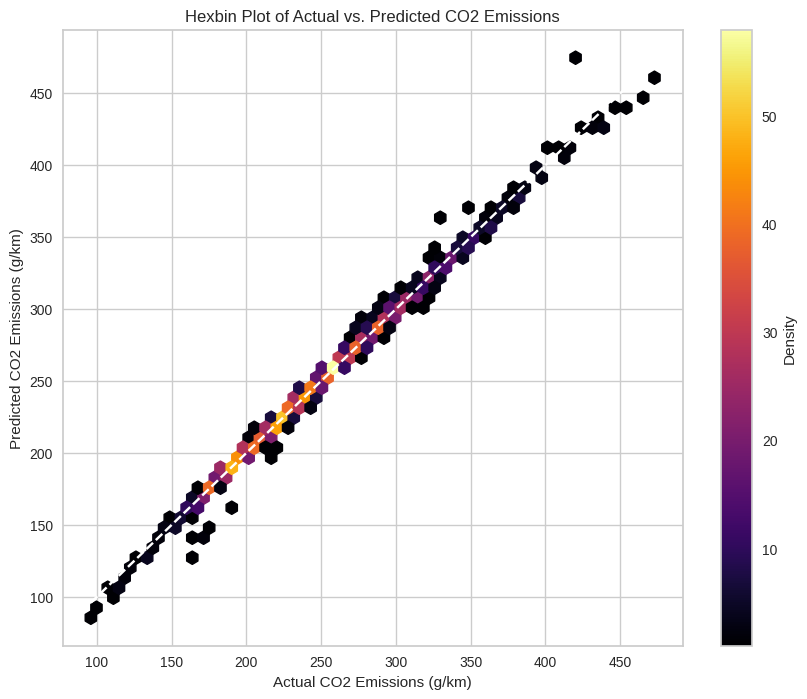

In [ ]:
plt.figure(figsize=(10, 8))

# Creating the hexbin plot
hb = plt.hexbin(x=actual_values['CO2 Emissions(g/km)'], y=yh_pred['predict'], gridsize=50, cmap='inferno', mincnt=1)
plt.colorbar(hb, label='Density')

# Adding a diagonal line to indicate perfect predictions
plt.plot([actual_values.min(), actual_values.max()], [actual_values.min(), actual_values.max()], 'w--')

plt.xlabel('Actual CO2 Emissions (g/km)')
plt.ylabel('Predicted CO2 Emissions (g/km)')
plt.title('Hexbin Plot of Actual vs. Predicted CO2 Emissions')
plt.show()

# **Inference**

This is a  hexbin plot, which is a two-dimensional histogram where the bins are hexagonal. This type of plot is useful for visualizing the structure of data with potentially thousands of points. It can be particularly effective when points are densely packed and a scatter plot would result in overplotting, where individual points may be indistinguishable.

* The bulk of the data points- **darker colours are aligned along the diagonal suggesting that the model predictions are good**.

* The color gradient shows where predictions are most densely packed. The **highest density of points- lighter colours occurs along the line of equality where predicted equals actual**, which show good model predictions

* Some points are far from the line which could be outliers where the model's predictions are significantly off.

# **Visualization of the metrics in Lasso Regularization with and without Optimum Lambda**

MSE: Regular Lasso - 26.52, Lasso with Optimum Lambda - 18.86, Improvement: 28.89%
RMSE: Regular Lasso - 5.15, Lasso with Optimum Lambda - 4.34, Improvement: 15.67%
MAE: Regular Lasso - 3.12, Lasso with Optimum Lambda - 2.76, Improvement: 11.69%
RMSLE: Regular Lasso - 0.02, Lasso with Optimum Lambda - 0.02, Improvement: 11.31%
R^2: Regular Lasso - 0.99, Lasso with Optimum Lambda - 0.99, Improvement: -0.20%


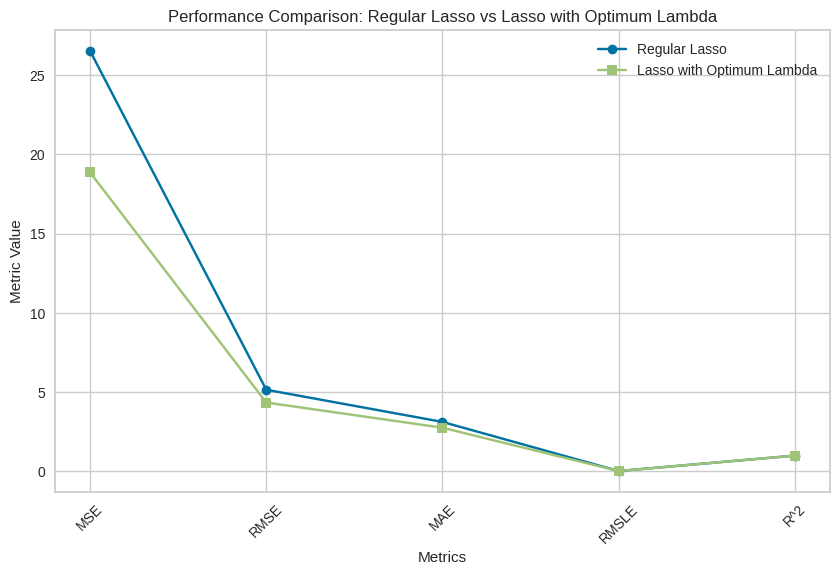

In [ ]:
# Extract performance metrics for both models
model_1_performance = emission_glm_regularization_lasso.model_performance()
model_2_performance = lambda_search.model_performance()

# Dynamically obtain the metrics
model_1_metrics = {
    "MSE": model_1_performance.mse(),
    "RMSE": model_1_performance.rmse(),
    "MAE": model_1_performance.mae(),
    "RMSLE": model_1_performance.rmsle(),
    "R^2": model_1_performance.r2()
}

model_2_metrics = {
    "MSE": model_2_performance.mse(),
    "RMSE": model_2_performance.rmse(),
    "MAE": model_2_performance.mae(),
    "RMSLE": model_2_performance.rmsle(),
    "R^2": model_2_performance.r2()
}

# Metrics names for plotting
metrics_names = list(model_1_metrics.keys())

# Values for each metric for both models
model_1_values = [model_1_metrics[metric] for metric in metrics_names]
model_2_values = [model_2_metrics[metric] for metric in metrics_names]

# Print the metric values and improvement percentage
for metric, value1, value2 in zip(metrics_names, model_1_values, model_2_values):
    improvement_percent = ((value1 - value2) / value1) * 100
    print(f'{metric}: Regular Lasso - {value1:.2f}, Lasso with Optimum Lambda - {value2:.2f}, Improvement: {improvement_percent:.2f}%')

# Plotting
x = range(len(metrics_names))
plt.figure(figsize=(10, 6))

plt.plot(x, model_1_values, label='Regular Lasso', marker='o')
plt.plot(x, model_2_values, label='Lasso with Optimum Lambda', marker='s')

plt.title('Performance Comparison: Regular Lasso vs Lasso with Optimum Lambda')
plt.ylabel('Metric Value')
plt.xlabel('Metrics')
plt.xticks(x, metrics_names, rotation=45)
plt.legend()
plt.grid(True)

plt.show()


# **Inference**

* Based on the reported metrics, it seems that the optimal value of lambda resulted in a slightly improved model compared to the non-regularized model.

* The MSE, RMSE, and MAE all decreased slightly, indicating that the model is making slightly more accurate predictions on the training data.

* The R^2 value, which measures how well the model fits the data, decreased slightly, which may indicate that the model is not overfitting the training data as much.

**Overall, the lambda search seems to have resulted in a slightly improved model.**



# Residual Analysis

> Residual Analysis plots the fitted values vs residuals on a test dataset. Ideally, residuals should be randomly distributed. Patterns in this plot can indicate potential problems with the model selection, e.g., using simpler model than necessary, not accounting for heteroscedasticity, autocorrelation, etc. Note that if you see "striped" lines of residuals, that is an artifact of having an integer valued (vs a real valued) response variable.

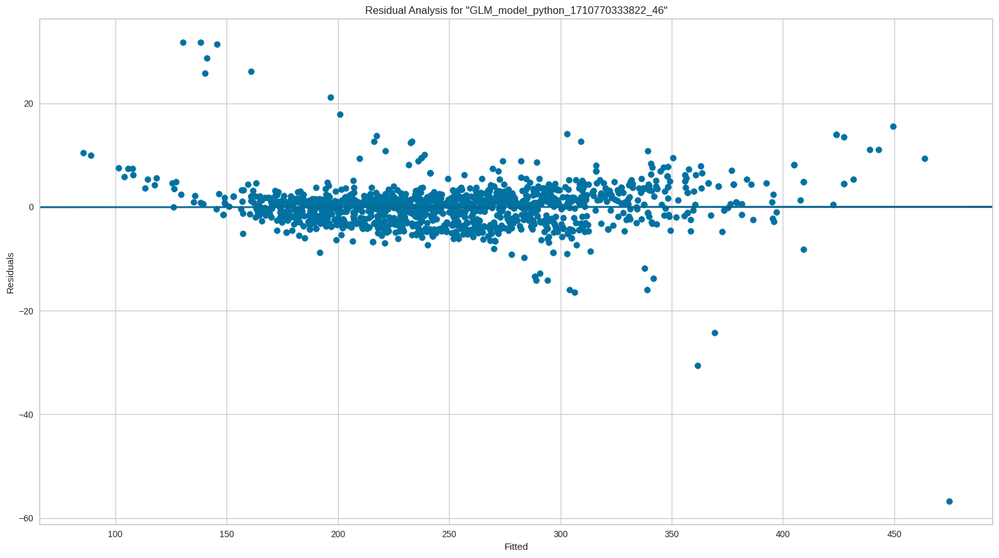

# Learning Curve Plot

> Learning curve plot shows the loss function/metric dependent on number of iterations or trees for tree-based algorithms. This plot can be useful for determining whether the model overfits.

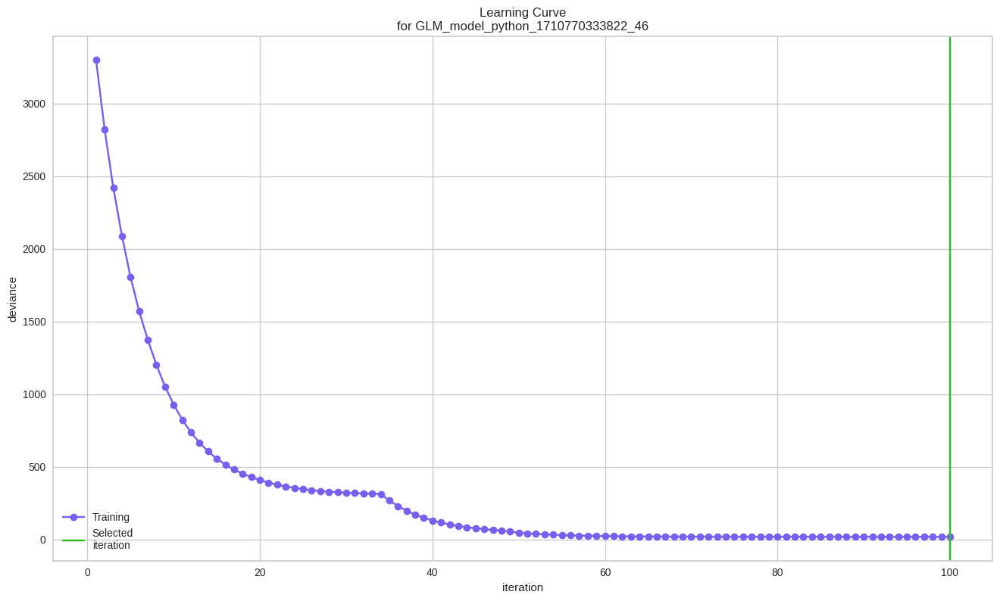

# Variable Importance

> The variable importance plot shows the relative importance of the most important variables in the model.

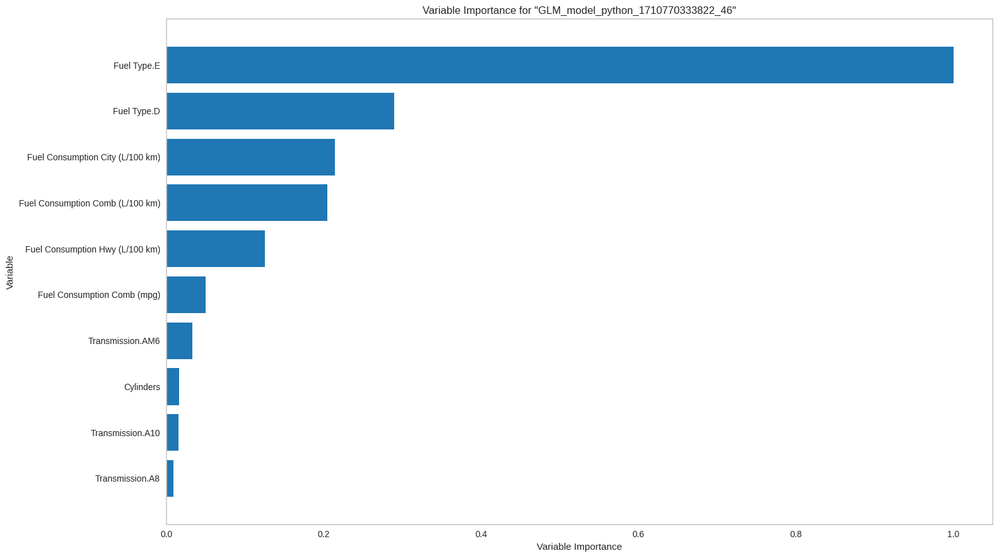

# Partial Dependence Plots

> Partial dependence plot (PDP) gives a graphical depiction of the marginal effect of a variable on the response. The effect of a variable is measured in change in the mean response. PDP assumes independence between the feature for which is the PDP computed and the rest.

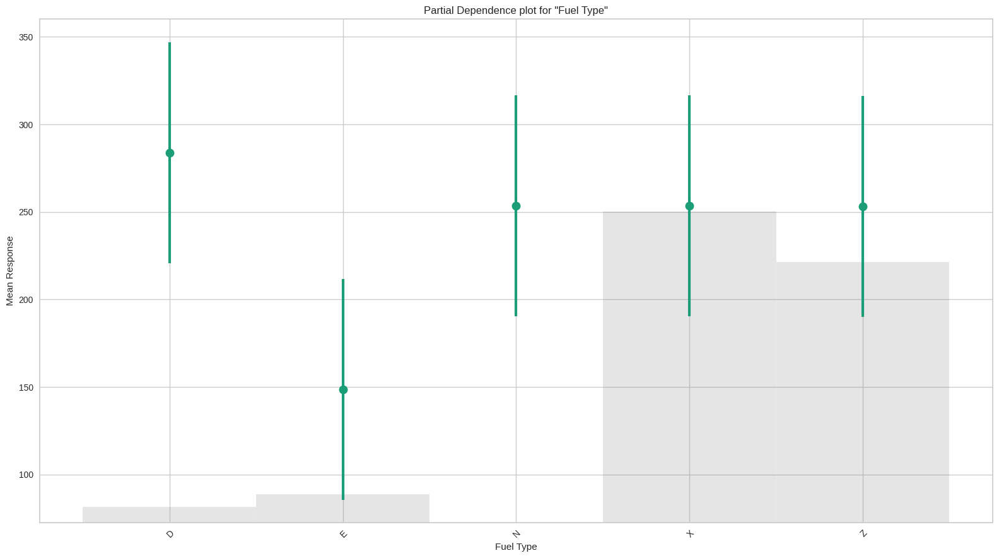

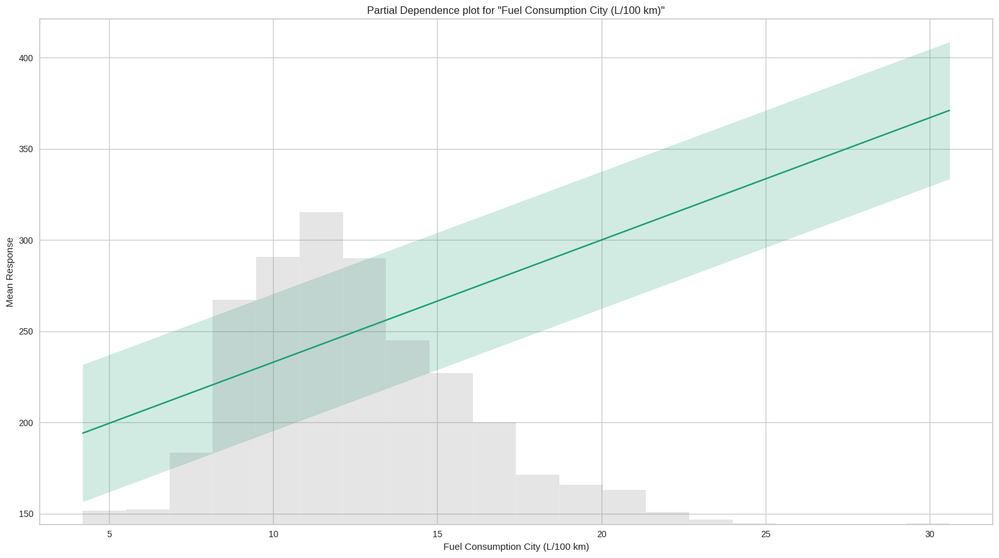

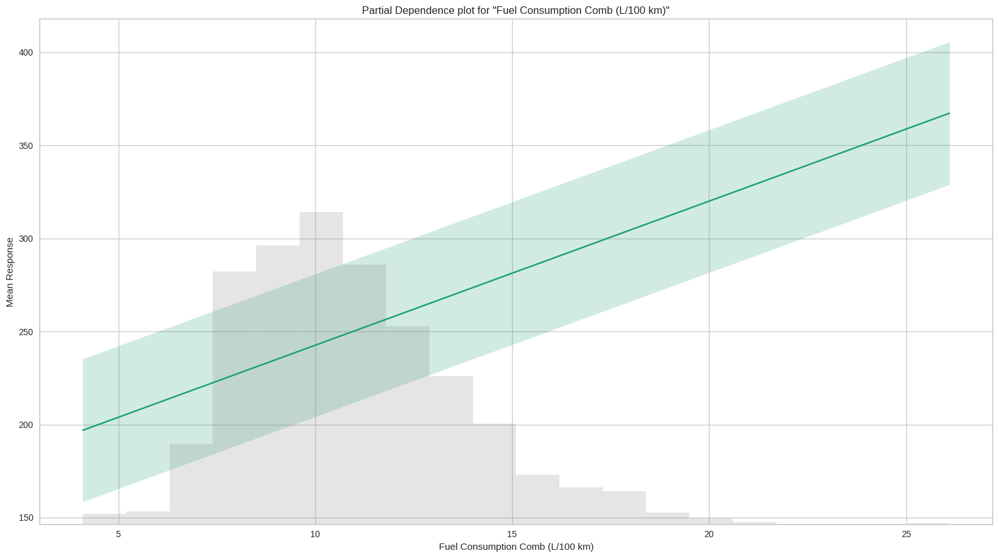

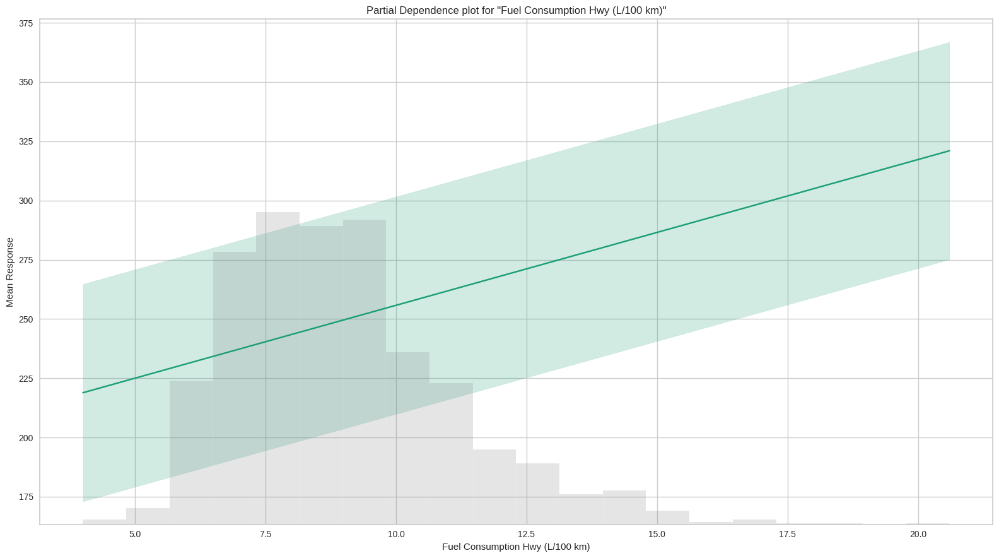

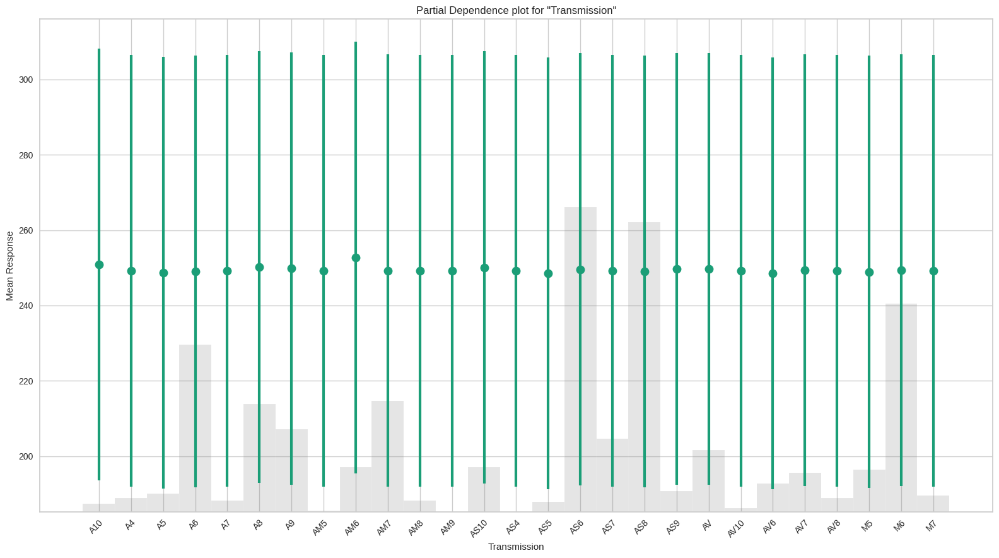

# Individual Conditional Expectation

> An Individual Conditional Expectation (ICE) plot gives a graphical depiction of the marginal effect of a variable on the response. ICE plots are similar to partial dependence plots (PDP); PDP shows the average effect of a feature while ICE plot shows the effect for a single instance. This function will plot the effect for each decile. In contrast to the PDP, ICE plots can provide more insight, especially when there is stronger feature interaction.

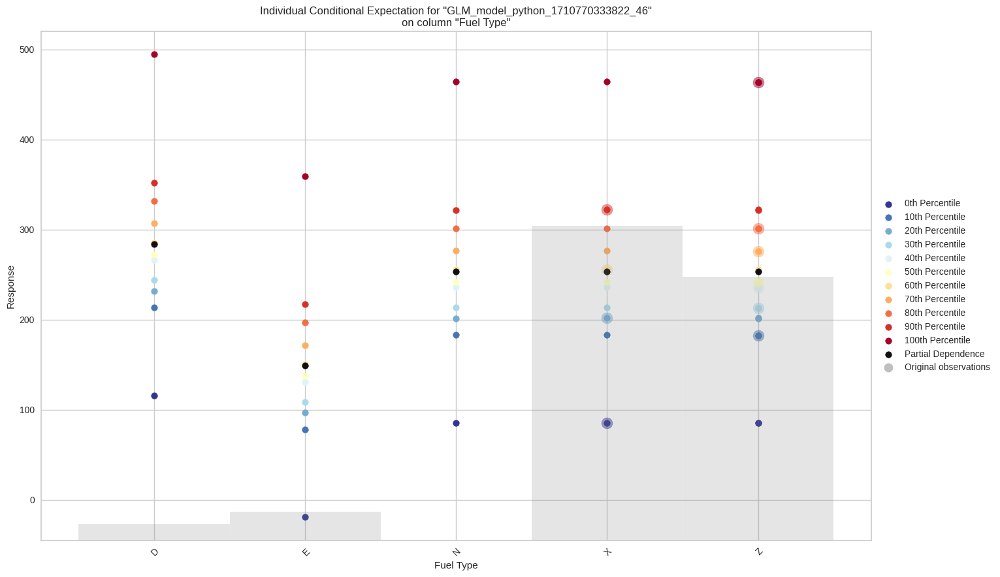

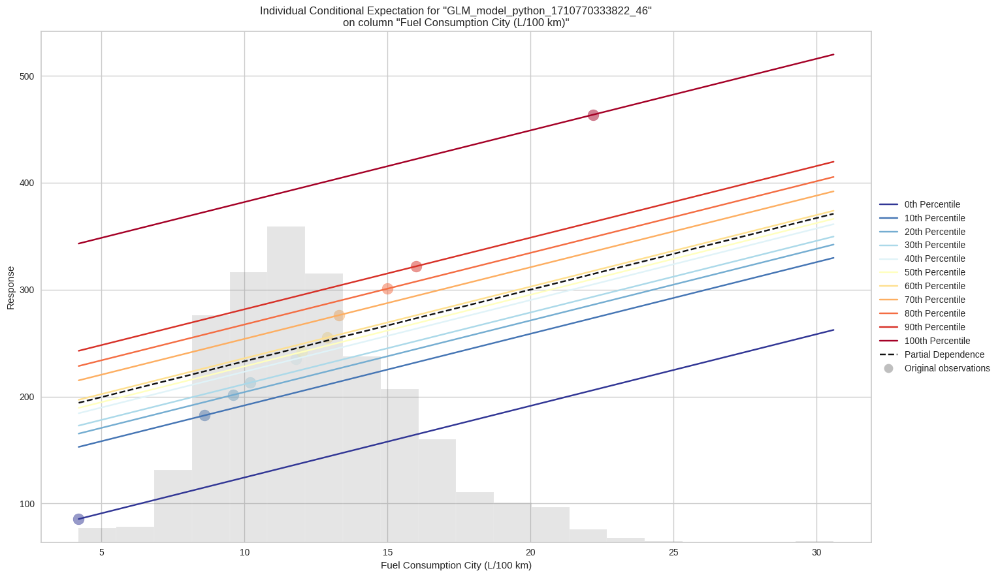

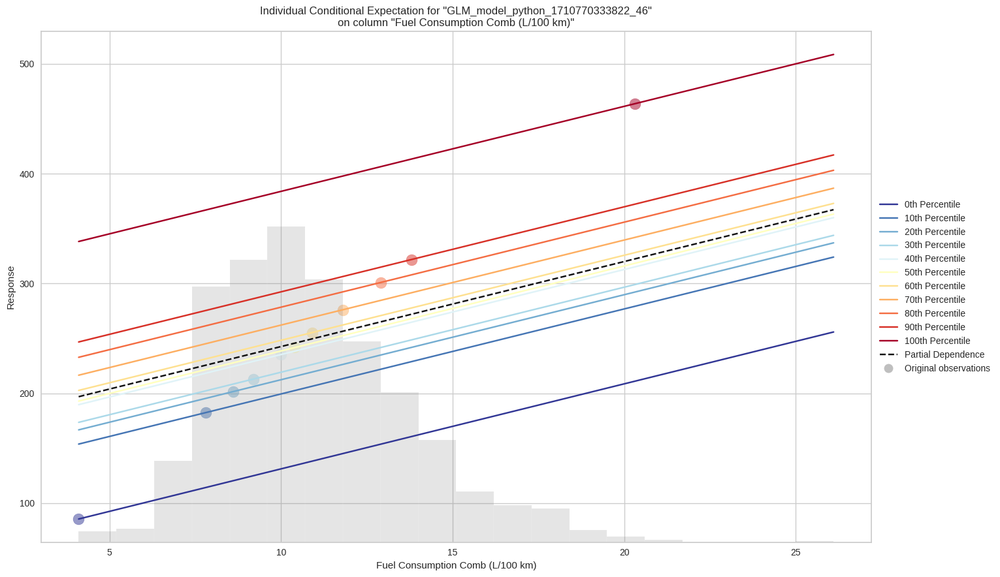

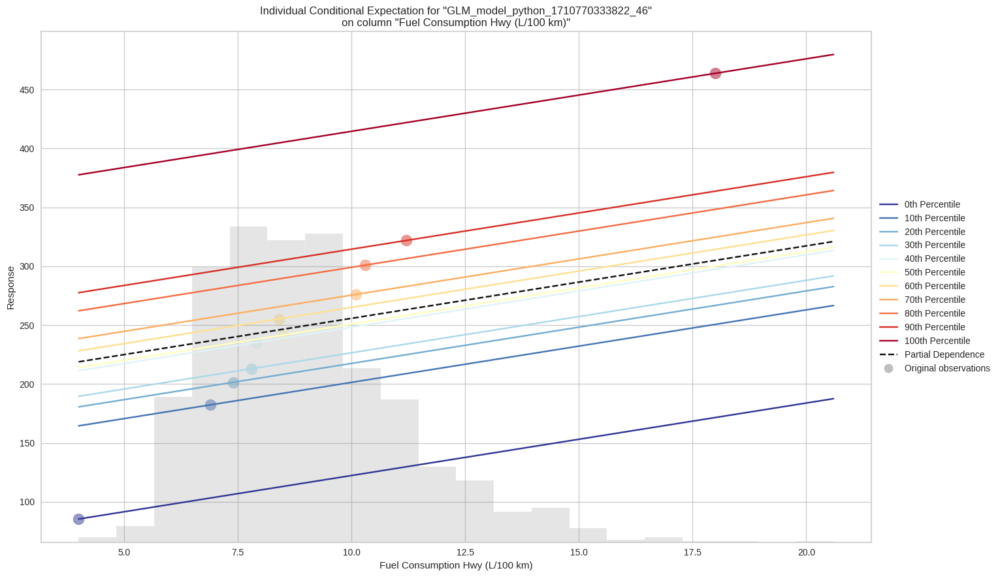

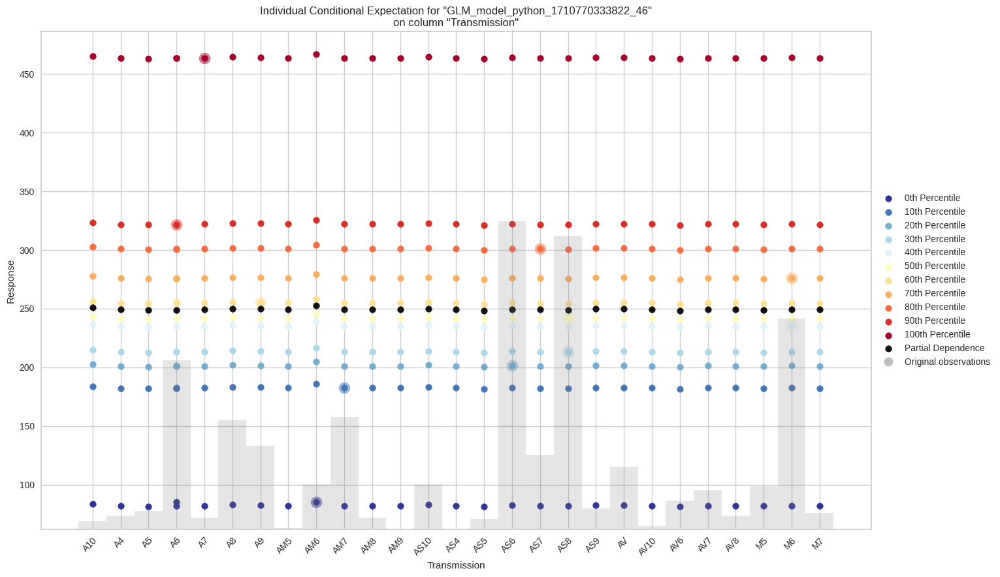

In [ ]:
viz=lambda_search.explain(df_htest)

# **Inference**

**Residual Analysis**
  * The residuals are reasonably well distributed, with a concentration around the zero line.
  * There are some points that deviate significantly from zero and may indicate potential outliers or that the model might not be as accurate in that high range.

**Learning Curve Plot**
  * Rapid Decrease in Deviance: Initially, there is a rapid decrease in model deviance as the number of iterations increases. This suggests that the model repidly learns from the training data.

  * After the initial decrease, the curve flattens out, which indicates that further iterations do not significantly contribute to the model's performance on the training data. The model has likely reached its best performance.

  * The green vertical line indicates a iteration that has been selected. This could be the iteration at which the model's performance is evaluated

**Partial Dependency Plot**
  * Mean response for different values of a feature means how the model's predictions change on average as that feature's values change, while all other features are held constant. .
  
  * Gray bars at the bottom of the plot represent the distribution of the features in the dataset.

  * The vertical length of the lines indicates the size of the confidence interval. A longer line suggests a larger interval and thus more uncertainty or variability in the predictions for that category of the feature.

  * The dot in the middle of the interval represents the estimated mean response for that category of the feature when all other features in the model are held constant.

**Individual Conditional Expectation Plot**
  * Colored Dots: Each dot represents an observation from the dataset at different percentiles of the response distribution for a given fuel type. The color of the dot indicates which percentile of the response it represents, with blue being lower percentiles (e.g., 0th or 10th) and red being higher percentiles (e.g., 90th or 100th). This means that each vertical line of dots is showing how the response varies across all observations that have the same fuel type.

  * Gray Dots: These are the original observations for each feature, providing a baseline for comparison.

  * Black Dots: These dots, located in the center of the color spectrum for each feature, represent the average prediction for that feature.

  * Variablity: The spread between the lines or dots at each level indicates variability in the predictions across different observations. If the lines or dots are widely spread, it suggests different observations have quite different predicted responses even at the same level.

  * Percentiles: If the warmer colored lines (representing higher percentiles) are consistently at the top, and the cooler colored lines (representing lower percentiles) are at the bottom it indicates a consistent trend across all percentiles.


# **Q9. Which hyperparameters are important?**
 # **Hyperparameter Tuning**

* Hyperparameter controls the behavior of the learning algorithm itself rather than directly affecting the model's predictions.

* It objectively searches different values for model hyperparameters and chooses a subset that results in a model that achieves the best performance on a given dataset.

* Using RandomizedSearchCV is a technique to efficiently search for the best hyperparameters of a machine learning model by randomly sampling from a defined search space

In [ ]:
import numpy as np

from sklearn.model_selection import train_test_split

from sklearn.ensemble import RandomForestClassifier

from sklearn.model_selection import RandomizedSearchCV

s = data['CO2 Emissions(g/km)']

t = data.drop(['CO2 Emissions(g/km)'], axis = 1)

t_train, t_test, s_train, s_test = train_test_split (t, s, random_state = 101, test_size = 0.2)

* Now, lets select RandomForestClassifer as the base model and specify the hyperparameters to tune (max_depth, n_estimators, min_samples_split) and the range of values to search over.

* The RandomizedSearchCV object random_rf is then fitted to the training data (t_train and s_train). After fitting, predictions are made on the test data (t_test).

* The predictions are obtained using the best estimator found during the hyperparameter search (random_rf.best_estimator_).

In [ ]:
mode = RandomForestRegressor()

param_vals = {'max_depth': [200, 500, 800, 1100], 'n_estimators': [100,200, 300, 400], 'min_samples_split' : [2,3,5]}

random_rf = RandomizedSearchCV(estimator=mode, param_distributions=param_vals,

#The number of parameter settings that are sampled=10 & The scoring metric used to evaluate the model is r2

n_iter=10, scoring='r2', cv=5,

refit=True, n_jobs=-1)

#Training and prediction

random_rf.fit(t_train, s_train)

preds = random_rf.best_estimator_.predict(t_test)

In [ ]:
random_rf.best_params_

# **Summary**

**1.** Is the relationship significant?

  * **The relationship is significant** considering most of the important independant variables have a p value less than 0.05 as calculated by the OLS method.

**2.** Are any model assumptions violated?

  * From the values of the correlation coeff we can understand for most independent variables there is a **linear relationship** with the dependent variable and hence assumption is **not violated**

  * From the eigen values as well as the correlation matrix we can understand that most of the variables are **highly correlated** and hence this assumption **is violated.**

  * From the plot for residuals we can see that it is **normally distributed** and hence the assumption is **not violated**

  * From the calculation of **residuals** we can see that the value is 2.0092 and hence even this assumption is **not violated.**


**3.** Is there any multicollinearity in the model?

  * **Yes**, from the calculation of the eigen values, from the inference of correlation matrix and VIF values we can see that there is high multicollinearity in the model.

**4.** In the multivariate models are predictor variables independent of all the other predictor variables?

  * **No**, from the calculation of the eigen values, from the inference of correlation matrix and VIF values we can see that there is high multicollinearity between the independent and dependent variable.

**5.** In multivariate models rank the most significant predictor variables and exclude insignificant ones from the model.

  * The Variable importance plot suggests that the most important predictor: are **Fuel Consumption Comb(L/100km), Fuel Consumption Comb(mpg), Fuel Type, Engine Size (L). **The insignificant ones- Make, Model and Vehicle Class were eliminated from the model for better performance.

**6.** Does the model make sense?

  * For a model to make sense it should follow all the assumptions, have expected p values, VIF between their respective ranges and RMSE should be as low as possible considering the minimum and maximum values of the target variable.
   
   **So overall the model makes sense. To increase the accuracy, some additional variables can be dropped depending on their importance. Furthermore, outliers can be removed or boosting, or ensemble model can be used.**

**7.** Does regularization help?

  * **Yes**, from the 3 tried regularization we can see that Lasso regularization with optimum value for lambda has helped with the overfitting in the inistal model.

**8.** Which independent variables are significant?

  * The Variable importance plot suggests that the most important predictor: are **Fuel Consumption Comb(L/100km), Fuel Consumption Comb(mpg), Fuel Type, Engine Size (L).**The insignificant ones- Make, Model and Vehicle Class were eliminated from the model for better performance.


**9.** Which hyperparameters are important?
  
  * The below hyperparameters are imporatant
  {'n_estimators': 300, 'min_samples_split': 2, 'max_depth': 800}


# **References**

1. https://docs.h2o.ai/h2o/latest-stable/h2o-docs/explain.html

1. https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/AutoML/CC_Kaggle_AutoML_Regression_Melbourne_Housing.ipynb

2. https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/AutoML/AutoML_Wine_Quality.ipynb

3. https://github.com/aiskunks/YouTube/blob/main/A_Crash_Course_in_Statistical_Learning/AutoML/AutoML_Smoke_Detection_Example.ipynb

4. https://chat.openai.com/

5. https://www.youtube.com/watch?v=91QljBnvM7s

6. https://www.youtube.com/watch?v=goyk5MO8OKA

Dataset : https://www.kaggle.com/datasets/bhuviranga/co2-emissions


# **License**
MIT License

Copyright (c) 2024 vaishveerkumar

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE.

